In [1]:
################################################################################
#### CODE TO CREATE THE FUTURE SUHI PROJECTIONS USING ESMS AND CREATE PLOTS ####
################################################################################

#Read in the packages to use
import numpy as np
import pandas as pd
import math
import datetime
import os
import pathlib
import matplotlib.pyplot as plt
import earthpy as et
import pickle
import random                                                        #for test city selection

#for displaying the cities on map
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
from matplotlib.ticker import ScalarFormatter
import matplotlib.ticker as ticker                                   #for setting axes ticks to whole numbers

#for plotting
from matplotlib import ticker 
from matplotlib.ticker import MaxNLocator                             #to keep whole numbers on the x-axis
from matplotlib.lines import Line2D                                   #for manual legend creation

# for normalising
from sklearn.preprocessing import StandardScaler    

# for loading netcdf clim data
import xarray as xr

# for regridding era5
#import xesmf as xe    

# for t tests
from scipy import stats

#for plotting background ESM LSTs
from cartopy.util import add_cyclic_point

#define the overpass time 
overpass_time = '13:30'

#Read in the data
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT', 'MEAN_SUHI'))
CITY_COUNTRY_lat_lon = pd.read_excel('CITY_COUNTRY_lat_lon_final.xlsx', index_col=None)

#read the table with all variables in as pickle
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','UHI_Project_Pickle_Files','All_cities'))   
with open('aqua_all_monthly_data_df2.pkl', 'rb') as f:
    all_monthly_data_df = pickle.load(f)
    
all_monthly_data_df = all_monthly_data_df[(all_monthly_data_df['Overpass'] == overpass_time)].reset_index(drop = True)
    

# get the ESM projections
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Climate_Model_Projections'))   
with open('LAI_Proj_df.pkl', 'rb') as f:
    LAI_Proj_df = pickle.load(f)

# get the LST projections
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Climate_Model_Projections'))   
with open('LST_Proj_df.pkl', 'rb') as f:
    LST_Proj_df = pickle.load(f)
    
#change the tp to m/day as this is the form it in input into the rerf model    
LAI_Proj_df['PR_Proj']   = LAI_Proj_df['PR_Proj'] /1000
LAI_Proj_df['PR_Preind']   = LAI_Proj_df['PR_Preind'] /1000
LAI_Proj_df['PR_2002_2020']   = LAI_Proj_df['PR_2002_2020'] /1000
LAI_Proj_df['PR_Proj_1deg']   = LAI_Proj_df['PR_Proj_1deg'] /1000

## Change the LST to celcius
LST_Proj_df['LST_Proj']   = LST_Proj_df['LST_Proj'] -273.15
LST_Proj_df['LST_Preind']   = LST_Proj_df['LST_Preind'] -273.15
LST_Proj_df['LST_2002_2020']   = LST_Proj_df['LST_2002_2020'] -273.15

# changes in the variables
LAI_Proj_df['LAI_Change'] = (LAI_Proj_df['LAI_Proj'] - LAI_Proj_df['LAI_Preind']).values
LAI_Proj_df['RH_Change'] = (LAI_Proj_df['RH_Proj'] - LAI_Proj_df['RH_Preind']).values.astype(float)
LAI_Proj_df['TP_Change'] = (LAI_Proj_df['PR_Proj'] - LAI_Proj_df['PR_Preind']).values.astype(float)
LAI_Proj_df['LAI_fract_change'] = (LAI_Proj_df['LAI_Change'] / LAI_Proj_df['LAI_Proj']).values.astype(float)

# ESM models with BCC removed as there is not RH projections/ historical
LAI_Proj_df2 = LAI_Proj_df[LAI_Proj_df.Model != 'BCC-CSM2-MR'].reset_index(drop = True).copy()

# Additional variables
# add evi difference variable
all_monthly_data_df['EVI_D'] = all_monthly_data_df['EVI_U'] - all_monthly_data_df['EVI_R'] 

all_monthly_data_df['LOG_AREA'] = np.log10(all_monthly_data_df.Monthly_Area.values.astype(float))
all_monthly_data_df['LOG_ROUGHNESS_LENGTH_R'] = np.log10(all_monthly_data_df.ROUGHNESS_LENGTH_R.values.astype(float))

# elevation diff
all_monthly_data_df['ELEVATION_D'] = all_monthly_data_df['ELEVATION_U'] - all_monthly_data_df['ELEVATION_R']
all_monthly_data_df['STD_ELEVATION_D'] = all_monthly_data_df['STD_ELEVATION_U'] - all_monthly_data_df['STD_ELEVATION_R']
#add in albedo diff
all_monthly_data_df['WSA_D'] = all_monthly_data_df['WSA_U'] - all_monthly_data_df['WSA_R']
all_monthly_data_df['BSA_D'] = all_monthly_data_df['BSA_U'] - all_monthly_data_df['BSA_R']


#decide on the target variable
#target_variable = 'SUHI_PEAK_GSA'
target_variable = 'SUHI_MEAN'

# Chosen variables from RR permuations, SUHI_MEAN
predictor_variables =  ['EVI_U', 'EVI_D', 'LOG_AREA',  'WSA_D', 'ELEVATION_D', 'RH', 'TP', 'STD_ELEVATION_U']

#clean the data - first remove columns which are not the target or predictor variables, then remove nans
variables = predictor_variables.copy()
variables.append(target_variable)
variables.append('Overpass')
variables.append('month')
variables.append('year')
variables.append('CITY_COUNTRY')
variables.append('City')
variables.append('EVI_R')
variables.append('T2M')
all_monthly_data_df2 = all_monthly_data_df[variables]
all_monthly_data_df2 = all_monthly_data_df2.dropna().reset_index(drop = True)

###########################################################
################### TEST TRAIN ############################
###########################################################

#test_train_split = 'early_late'
test_train_split = 'odd_even'

#create training and test datasets

data_first_yrs = all_monthly_data_df2[((all_monthly_data_df2['year'] <=2011 ) 
                                    & (all_monthly_data_df2['Overpass'] == overpass_time))].copy()
data_last_yrs = all_monthly_data_df2[((all_monthly_data_df2['year'] > 2011)
                                  & (all_monthly_data_df2['Overpass'] == overpass_time))].copy()


all_yrs = [2002, 2003,2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
                 2020]
odd_yrs = [2003, 2005, 2007, 2009, 2011,  2013,  2015,  2017,  2019]

data_odd_yrs = all_monthly_data_df2[((all_monthly_data_df2['year'].isin(odd_yrs)) 
                                    & (all_monthly_data_df2['Overpass'] == overpass_time))].copy()
data_even_yrs = all_monthly_data_df2[(~(all_monthly_data_df2['year'].isin(odd_yrs))
                                  & (all_monthly_data_df2['Overpass'] == overpass_time))].copy()

if test_train_split == 'early_late':
    training_data = data_first_yrs
    test_data = data_last_yrs    
    train_test_folder = 'Early_Late'
    
if test_train_split == 'odd_even':
    training_data = data_odd_yrs
    test_data = data_even_yrs      
    train_test_folder = 'Odd_Even'
    
#split the data into predictors and target
X_train = training_data[predictor_variables]       #predictors
y_train = training_data[target_variable]           #target

X_test = test_data[predictor_variables]            #predictors
y_test = test_data[target_variable]                #target

# all data, so predictions can be added into the observations dataset
X_all_data = all_monthly_data_df2[predictor_variables]

#create normalised datasets
scaler = StandardScaler()
# train test yvals
y_train_norm = pd.DataFrame(scaler.fit_transform(y_train.values.reshape(-1,1)), columns = [target_variable]) #fit and transform
y_test_norm = pd.DataFrame(scaler.transform(y_test.values.reshape(-1, 1)), columns = [target_variable]) #transform only

# for other models
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train.values)
                               , columns = predictor_variables) #fit and transform
X_test_norm = pd.DataFrame(scaler.transform(X_test.values)
                               , columns = predictor_variables) #transform only
X_all_data_norm = pd.DataFrame(scaler.transform(X_all_data.values)
                               , columns = predictor_variables) #transform only



In [7]:
print('13:30 range', df2[df2.Overpass == '13:30'].SUHI_MEAN.min(), df2[df2.Overpass == '13:30'].SUHI_MEAN.max())
print('01:30 range', df2[df2.Overpass == '01:30'].SUHI_MEAN.min(), df2[df2.Overpass == '01:30'].SUHI_MEAN.max())

13:30 range -3.969661635976859 5.436225941677826
01:30 range 0.26492713707041576 2.798923898544374


In [8]:
print('Annual RH Change Range (%):',
      Climate_Proj_df.groupby(['CITY_COUNTRY','Model']).mean(numeric_only = True).RH_Change.min(),
      Climate_Proj_df.groupby(['CITY_COUNTRY','Model']).mean(numeric_only = True).RH_Change.max())

print('Annual TP Change Range (mm/day):',
      1000*Climate_Proj_df.groupby(['CITY_COUNTRY','Model']).mean(numeric_only = True).TP_Change.min(),
      1000*Climate_Proj_df.groupby(['CITY_COUNTRY','Model']).mean(numeric_only = True).TP_Change.max())

Annual RH Change Range (%): -12.525362968444824 25.575136184692383
Annual TP Change Range (mm/day): -1.4040532354556488 1.6074100458354224


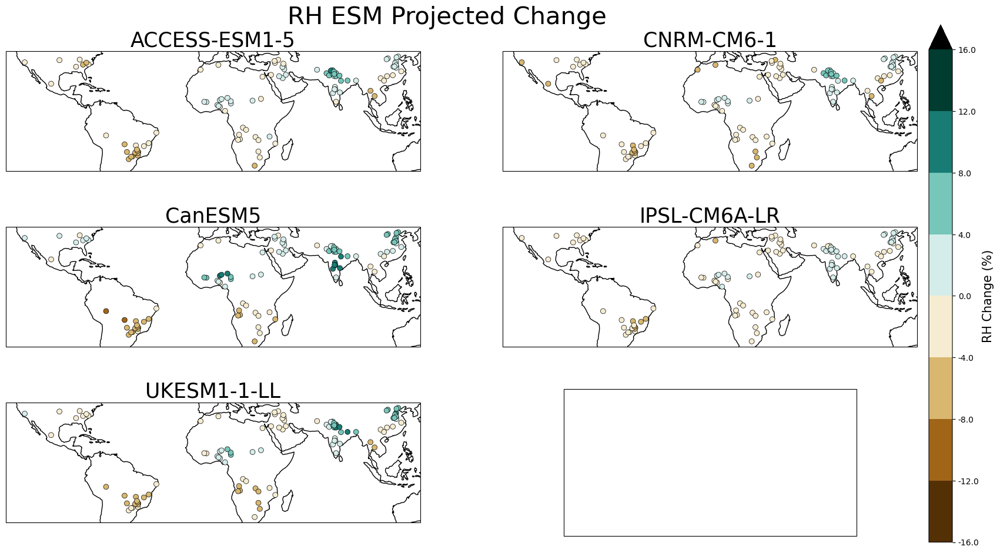

In [24]:
#####################################################################
######## CHANGES FOR EACH EARTH SYSTEM MODEL ########################
#####################################################################

climate_var = 'RH'
climate_var_units = '%'

#plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=25)     # fontsize of the axes title
plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

# create the colormap
scale_min = -16
scale_max = 16
cmap = plt.cm.BrBG  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

cmap.set_over(color = 'black')

bounds = np.linspace(scale_min, scale_max, 9)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


#create the axes
fig, axes = plt.subplots(3,2 ,figsize=(20,11), subplot_kw={"projection": ccrs.PlateCarree()})

plt.suptitle('{} ESM Projected Change'.format(climate_var), y = 0.93, fontsize = 30)

row_num = 0
col_num = 0
min_change = []
max_change = []
model_annual_change_df = pd.DataFrame()

for model in list(set(LAI_Proj_df2.Model)):
    
    model_df = LAI_Proj_df2[LAI_Proj_df2.Model == model].copy()
     
    df = model_df.groupby(['CITY_COUNTRY']).mean(numeric_only = True).reset_index()
    city_lats = df.Lat.values
    city_lons = df.Lon.values
    VAR_CHANGE = df['{}_Change'.format(climate_var)].values
    
    axes[row_num,col_num].coastlines()
    im = axes[row_num,col_num].scatter(city_lons, city_lats, zorder=5, c=VAR_CHANGE, linewidths = 0.5,
                                        s =40,edgecolor = 'black',cmap= cmap, norm = norm)
    
    
    axes[row_num,col_num].set(title = model)  
    
    model_annual_df = pd.DataFrame({'CITY_COUNTRY': CITY_COUNTRY_list, 'Lat':city_lats, 'Lon':city_lons,
                                   'Annual_Mean_{}_change'.format(climate_var): VAR_CHANGE})
    model_annual_df['Model'] = model
    model_annual_change_df = pd.concat([model_annual_change_df, model_annual_df])
    # move the col and row nums on for the next plot
    if col_num == 1:
        col_num = 0
        row_num = row_num + 1
    
    elif col_num == 0:
        col_num = 1

#get size and extent of axes:
axpos = axes[1,1].get_position()
pos_x = axpos.x0 + axpos.width +0.01  #+ 0.25*axpos.width
pos_y = 0.1
cax_width = 0.02
cax_height = 0.8 #2*axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

fig.colorbar(im, cax = pos_cax,  label = 'RH Change (%)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%.1f', extend = 'max')   

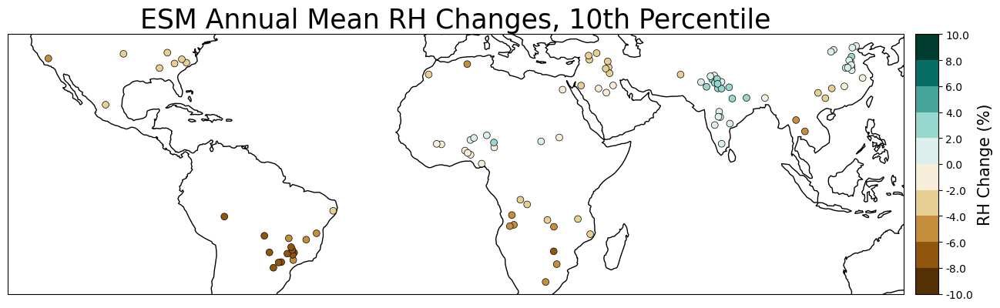

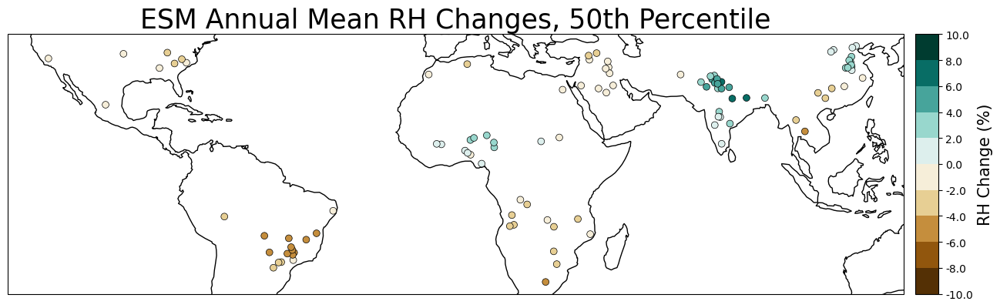

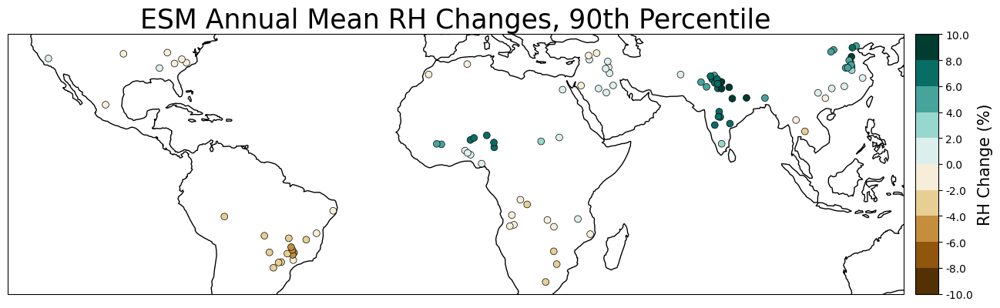

In [25]:
############################################################################
######## MODEL SPREAD: 10th, 50th, 90th Percentiles ########################
############################################################################

# get the median, 10th and 90th percentile changes
spread_df = pd.DataFrame ()
for i in range(len(CITY_COUNTRY_list)):
    CITY_COUNTRY = CITY_COUNTRY_list[i]
    var_changes = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].
                Annual_Mean_RH_change)
    lat = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lat.values[0])
    lon = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lon.values[0])

    df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon], 
              'median_var_change':[np.percentile(var_changes, 50)],
              'ten_percentile_var_change':[np.percentile(var_changes, 10)],
              'ninety_percentile_var_change':[np.percentile(var_changes, 90)]}, index = [i])

    spread_df = pd.concat([spread_df, df])

# create the colormap
scale_min = -10
scale_max = 10
cmap = plt.cm.BrBG  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 11)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
#cmap.set_over(color = 'black')

city_lats = spread_df.Lat.values
city_lons = spread_df.Lon.values
median_var_change = spread_df.median_var_change.values
ten_percentile_var_change = spread_df.ten_percentile_var_change.values
ninety_percentile_var_change = spread_df.ninety_percentile_var_change.values

####################################
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 10th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ten_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change ({})'.format(climate_var, climate_var_units), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_10_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 50th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=median_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change ({})'.format(climate_var, climate_var_units), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_50_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 90th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ninety_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change ({})'.format(climate_var, climate_var_units), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_90_percentile.png'.format(climate_var), bbox_inches = 'tight')

In [26]:
spread_df.ten_percentile_var_change.min(), spread_df.ninety_percentile_var_change.max() 

(-7.996720441182454, 9.253482405344647)

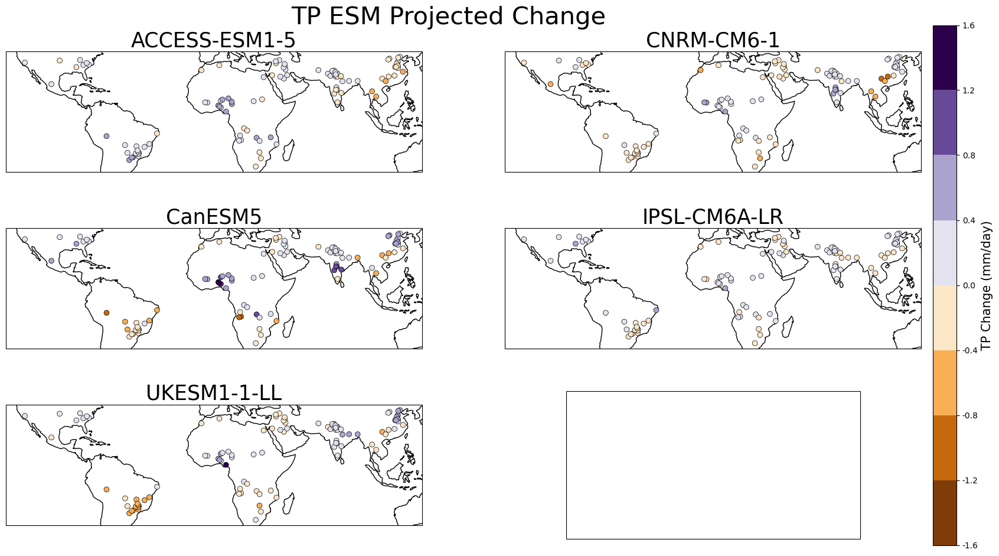

In [27]:
#####################################################################
######## CHANGES FOR EACH EARTH SYSTEM MODEL ########################
#####################################################################

climate_var = 'TP'
climate_var_units = 'mm/day'

#plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=25)     # fontsize of the axes title
plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

# create the colormap
scale_min = -1.6
scale_max = 1.6
cmap = plt.cm.PuOr  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

cmap.set_over(color = 'black')

bounds = np.linspace(scale_min, scale_max, 9)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


#create the axes
fig, axes = plt.subplots(3,2 ,figsize=(20,11), subplot_kw={"projection": ccrs.PlateCarree()})

plt.suptitle('{} ESM Projected Change'.format(climate_var), y = 0.93, fontsize = 30)

row_num = 0
col_num = 0
min_change = []
max_change = []
model_annual_change_df = pd.DataFrame()

for model in list(set(LAI_Proj_df2.Model)):
    
    model_df = LAI_Proj_df2[LAI_Proj_df2.Model == model].copy()
     
    df = model_df.groupby(['CITY_COUNTRY']).mean(numeric_only = True).reset_index()
    #CITY_COUNTRY_list = df.CITY_COUNTRY.values
    city_lats = df.Lat.values
    city_lons = df.Lon.values
    VAR_CHANGE = 1000*df['{}_Change'.format(climate_var)].values
    
    axes[row_num,col_num].coastlines()
    im = axes[row_num,col_num].scatter(city_lons, city_lats, zorder=5, c=VAR_CHANGE, linewidths = 0.5,
                                        s =40,edgecolor = 'black',cmap= cmap, norm = norm)
    
    
    axes[row_num,col_num].set(title = model)  
    
    model_annual_df = pd.DataFrame({'CITY_COUNTRY': CITY_COUNTRY_list, 'Lat':city_lats, 'Lon':city_lons,
                                   'Annual_Mean_{}_change'.format(climate_var): VAR_CHANGE})
    model_annual_df['Model'] = model
    model_annual_change_df = pd.concat([model_annual_change_df, model_annual_df])
    # move the col and row nums on for the next plot
    if col_num == 1:
        col_num = 0
        row_num = row_num + 1
    
    elif col_num == 0:
        col_num = 1

#get size and extent of axes:
axpos = axes[1,1].get_position()
pos_x = axpos.x0 + axpos.width +0.01  #+ 0.25*axpos.width
pos_y = 0.1
cax_width = 0.02
cax_height = 0.8 #2*axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

fig.colorbar(im, cax = pos_cax,  label = '{} Change ({})'.format(climate_var, climate_var_units), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%.1f')   

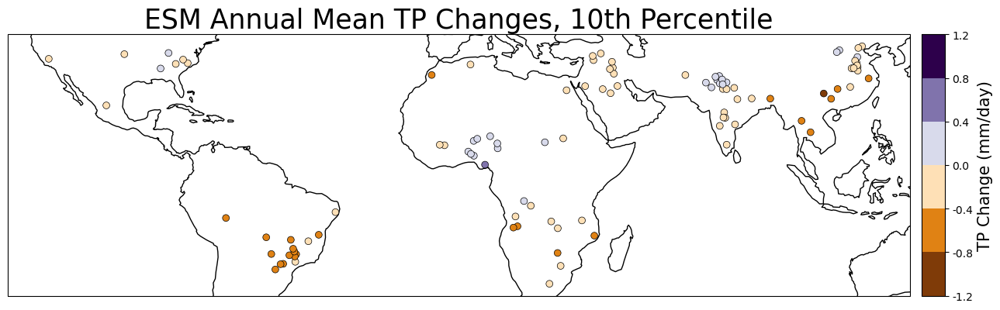

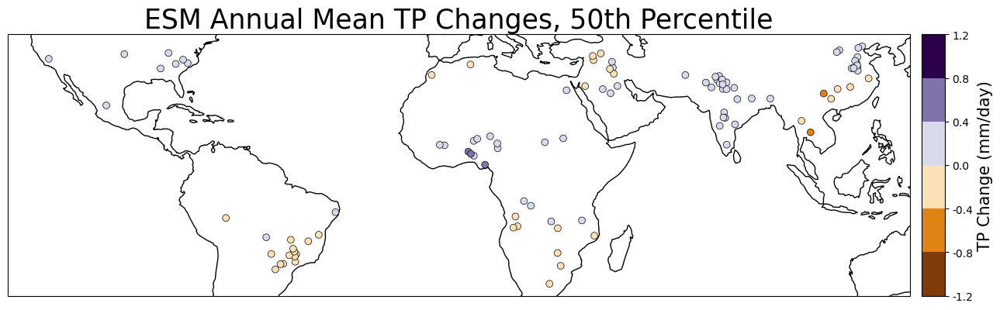

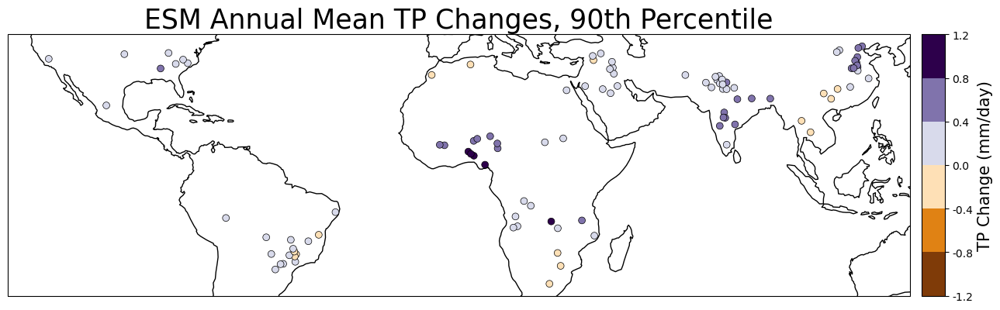

In [28]:
############################################################################
######## MODEL SPREAD: 10th, 50th, 90th Percentiles ########################
############################################################################

# get the median, 10th and 90th percentile changes
spread_df = pd.DataFrame ()
for i in range(len(CITY_COUNTRY_list)):
    CITY_COUNTRY = CITY_COUNTRY_list[i]
    var_changes = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].
                Annual_Mean_TP_change)
    lat = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lat.values[0])
    lon = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lon.values[0])

    df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon], 
              'median_var_change':[np.percentile(var_changes, 50)],
              'ten_percentile_var_change':[np.percentile(var_changes, 10)],
              'ninety_percentile_var_change':[np.percentile(var_changes, 90)]}, index = [i])

    spread_df = pd.concat([spread_df, df])

# create the colormap
scale_min = -1.2
scale_max = 1.2
cmap = plt.cm.PuOr  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 7)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
#cmap.set_over(color = 'black')

city_lats = spread_df.Lat.values
city_lons = spread_df.Lon.values
median_var_change = spread_df.median_var_change.values
ten_percentile_var_change = spread_df.ten_percentile_var_change.values
ninety_percentile_var_change = spread_df.ninety_percentile_var_change.values

####################################
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 10th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ten_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change ({})'.format(climate_var, climate_var_units), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_10_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 50th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=median_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change ({})'.format(climate_var, climate_var_units), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_50_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 90th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ninety_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change ({})'.format(climate_var, climate_var_units), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_90_percentile.png'.format(climate_var), bbox_inches = 'tight')

In [29]:
spread_df.ten_percentile_var_change.min(), spread_df.ninety_percentile_var_change.max() 

(-0.8599155658157541, 1.228602163027972)

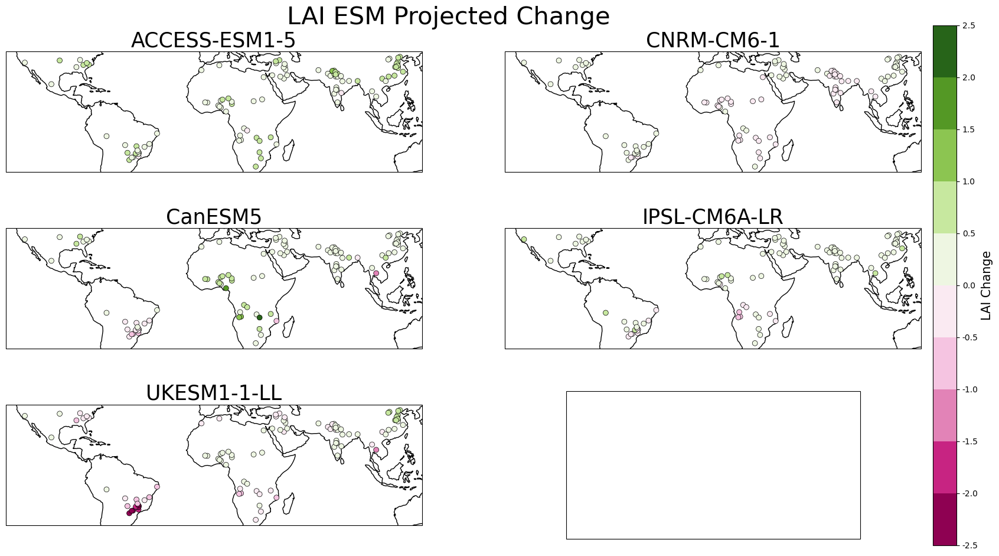

In [31]:
#####################################################################
######## CHANGES FOR EACH EARTH SYSTEM MODEL ########################
#####################################################################

climate_var = 'LAI'
climate_var_units = ''

#plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=25)     # fontsize of the axes title
plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

# create the colormap
scale_min = -2.5
scale_max = 2.5
cmap = plt.cm.PiYG  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

cmap.set_over(color = 'black')

bounds = np.linspace(scale_min, scale_max, 11)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


#create the axes
fig, axes = plt.subplots(3,2 ,figsize=(20,11), subplot_kw={"projection": ccrs.PlateCarree()})

plt.suptitle('{} ESM Projected Change'.format(climate_var), y = 0.93, fontsize = 30)

row_num = 0
col_num = 0
min_change = []
max_change = []
model_annual_change_df = pd.DataFrame()

for model in list(set(LAI_Proj_df2.Model)):
    
    model_df = LAI_Proj_df2[LAI_Proj_df2.Model == model].copy()
     
    df = model_df.groupby(['CITY_COUNTRY']).mean(numeric_only = True).reset_index()
    #CITY_COUNTRY_list = df.CITY_COUNTRY.values
    city_lats = df.Lat.values
    city_lons = df.Lon.values
    VAR_CHANGE = df['{}_Change'.format(climate_var)].values
    
    axes[row_num,col_num].coastlines()
    im = axes[row_num,col_num].scatter(city_lons, city_lats, zorder=5, c=VAR_CHANGE, linewidths = 0.5,
                                        s =40,edgecolor = 'black',cmap= cmap, norm = norm)
    
    
    axes[row_num,col_num].set(title = model)  
    
    model_annual_df = pd.DataFrame({'CITY_COUNTRY': CITY_COUNTRY_list, 'Lat':city_lats, 'Lon':city_lons,
                                   'Annual_Mean_{}_change'.format(climate_var): VAR_CHANGE})
    model_annual_df['Model'] = model
    model_annual_change_df = pd.concat([model_annual_change_df, model_annual_df])
    # move the col and row nums on for the next plot
    if col_num == 1:
        col_num = 0
        row_num = row_num + 1
    
    elif col_num == 0:
        col_num = 1

#get size and extent of axes:
axpos = axes[1,1].get_position()
pos_x = axpos.x0 + axpos.width +0.01  #+ 0.25*axpos.width
pos_y = 0.1
cax_width = 0.02
cax_height = 0.8 #2*axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

fig.colorbar(im, cax = pos_cax,  label = '{} Change'.format(climate_var), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%.1f')   

In [32]:
model_annual_change_df.Annual_Mean_LAI_change.min(), model_annual_change_df.Annual_Mean_LAI_change.max()

(-2.2181453704833984, 2.1963961124420166)

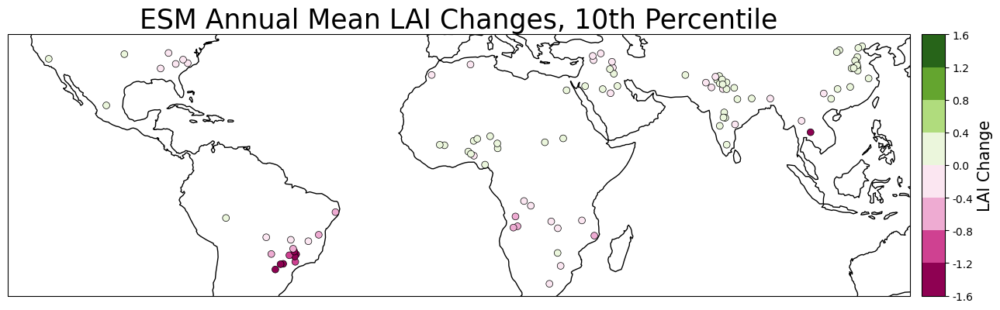

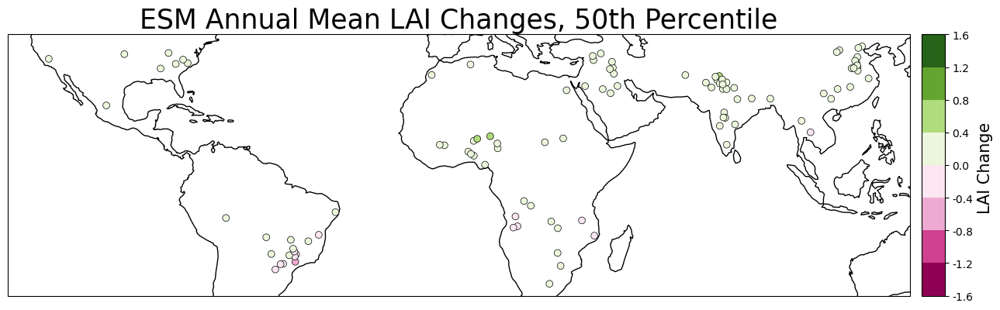

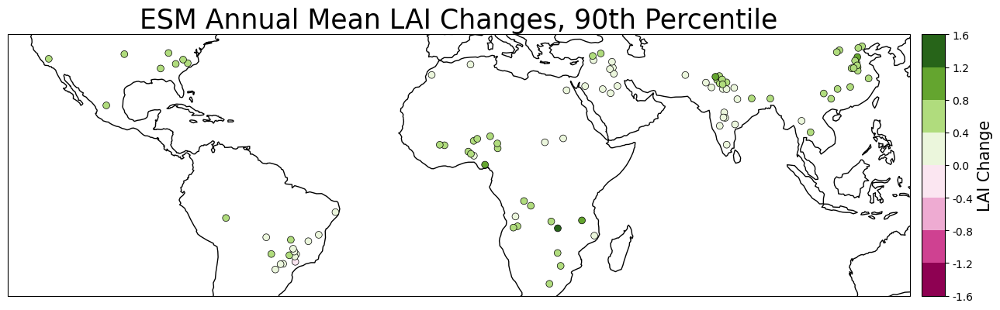

In [33]:
############################################################################
######## MODEL SPREAD: 10th, 50th, 90th Percentiles ########################
############################################################################

# get the median, 10th and 90th percentile changes
spread_df = pd.DataFrame ()
for i in range(len(CITY_COUNTRY_list)):
    CITY_COUNTRY = CITY_COUNTRY_list[i]
    var_changes = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].
                Annual_Mean_LAI_change)
    lat = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lat.values[0])
    lon = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lon.values[0])

    df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon], 
              'median_var_change':[np.percentile(var_changes, 50)],
              'ten_percentile_var_change':[np.percentile(var_changes, 10)],
              'ninety_percentile_var_change':[np.percentile(var_changes, 90)]}, index = [i])

    spread_df = pd.concat([spread_df, df])

# create the colormap
scale_min = -1.6
scale_max = 1.6
cmap = plt.cm.PiYG  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 9)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


city_lats = spread_df.Lat.values
city_lons = spread_df.Lon.values
median_var_change = spread_df.median_var_change.values
ten_percentile_var_change = spread_df.ten_percentile_var_change.values
ninety_percentile_var_change = spread_df.ninety_percentile_var_change.values

####################################
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 10th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ten_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change'.format(climate_var), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_10_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 50th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=median_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change '.format(climate_var), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_50_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean {} Changes, 90th Percentile'.format(climate_var))
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ninety_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '{} Change'.format(climate_var), cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_90_percentile.png'.format(climate_var), bbox_inches = 'tight')

In [34]:
spread_df.ten_percentile_var_change.min(), spread_df.ninety_percentile_var_change.max() 

(-1.5690395832061768, 1.569395685195923)

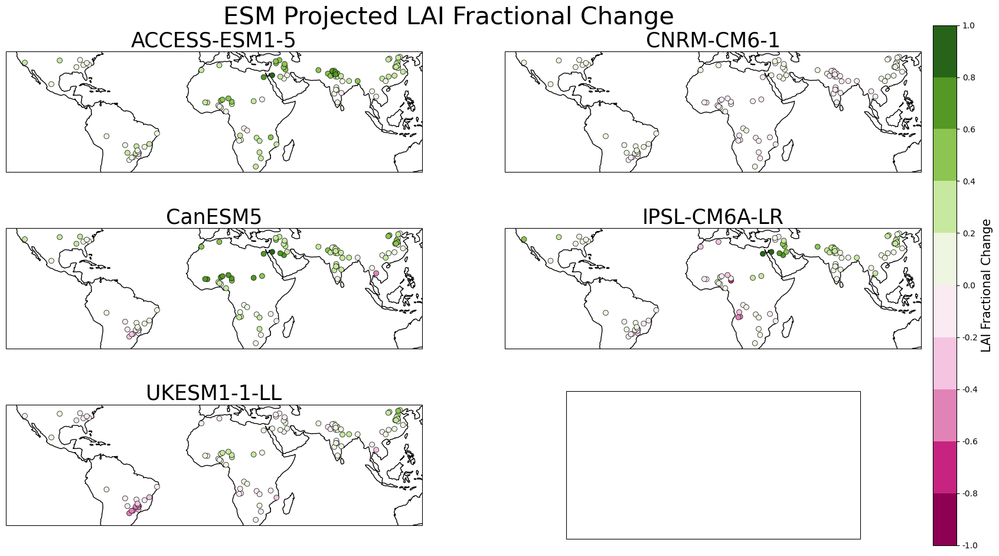

In [35]:
#####################################################################
######## CHANGES FOR EACH EARTH SYSTEM MODEL ########################
#####################################################################

climate_var = 'LAI_fract_change'
climate_var_units = ''

#plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=25)     # fontsize of the axes title
plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

# create the colormap
scale_min = -1
scale_max = 1
cmap = plt.cm.PiYG  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

cmap.set_over(color = 'black')

bounds = np.linspace(scale_min, scale_max, 11)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


#create the axes
fig, axes = plt.subplots(3,2 ,figsize=(20,11), subplot_kw={"projection": ccrs.PlateCarree()})

plt.suptitle('ESM Projected LAI Fractional Change', y = 0.93, fontsize = 30)

row_num = 0
col_num = 0
min_change = []
max_change = []
model_annual_change_df = pd.DataFrame()

for model in list(set(LAI_Proj_df2.Model)):
    
    model_df = LAI_Proj_df2[LAI_Proj_df2.Model == model].copy()
     
    df = model_df.groupby(['CITY_COUNTRY']).mean(numeric_only = True).reset_index()
    #CITY_COUNTRY_list = df.CITY_COUNTRY.values
    city_lats = df.Lat.values
    city_lons = df.Lon.values
    VAR_CHANGE = df['LAI_fract_change'].values
    
    axes[row_num,col_num].coastlines()
    im = axes[row_num,col_num].scatter(city_lons, city_lats, zorder=5, c=VAR_CHANGE, linewidths = 0.5,
                                        s =40,edgecolor = 'black',cmap= cmap, norm = norm)
    
    
    axes[row_num,col_num].set(title = model)  
    
    model_annual_df = pd.DataFrame({'CITY_COUNTRY': CITY_COUNTRY_list, 'Lat':city_lats, 'Lon':city_lons,
                                   'Annual_Mean_LAI_fract_change': VAR_CHANGE})
    model_annual_df['Model'] = model
    model_annual_change_df = pd.concat([model_annual_change_df, model_annual_df])
    # move the col and row nums on for the next plot
    if col_num == 1:
        col_num = 0
        row_num = row_num + 1
    
    elif col_num == 0:
        col_num = 1

#get size and extent of axes:
axpos = axes[1,1].get_position()
pos_x = axpos.x0 + axpos.width +0.01  #+ 0.25*axpos.width
pos_y = 0.1
cax_width = 0.02
cax_height = 0.8 #2*axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

fig.colorbar(im, cax = pos_cax,  label = 'LAI Fractional Change', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%.1f')   

In [36]:
model_annual_change_df.Annual_Mean_LAI_fract_change.min(), model_annual_change_df.Annual_Mean_LAI_fract_change.max()

(-0.7440573792749395, 0.9992349445819855)

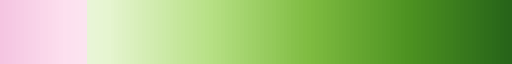

In [44]:
# creation of custom colormap so the white part is still centered on zero, cut out the middle part (20 both ways)
cmap = plt.cm.PiYG # define the colormap
cmaplist = [cmap(i) for i in range(cmap.N)]

cmaplist_crop = cmaplist[86:108] + cmaplist[148:]
cmap_crop = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist_crop, len(cmaplist_crop))

cmap_crop

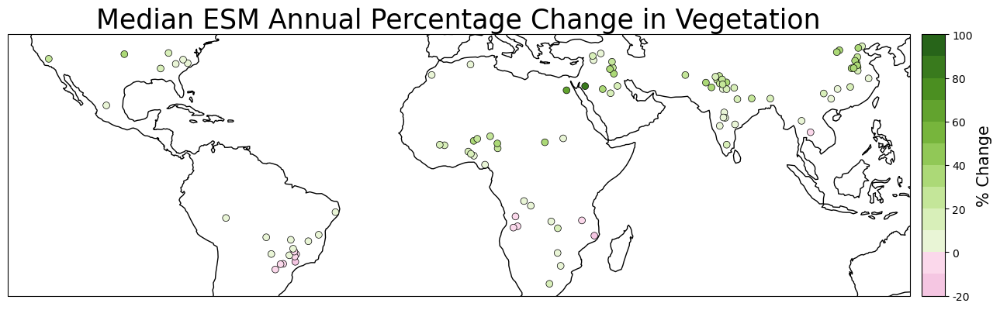

In [45]:
######## Fractional change in vegetation ###########

######## Median Change only plot #########

# create the colormap
scale_min = -20
scale_max = 100
cmap = cmap_crop  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 13)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
bounds_for_colorbar = np.linspace(scale_min, scale_max, 7)

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='Median ESM Annual Percentage Change in Vegetation')
ax.coastlines()
#ax.background_img(name = 'BM')

im = ax.scatter(city_lons, city_lats, zorder=5, c=100*median_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '% Change', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds_for_colorbar, boundaries=bounds_for_colorbar, format='%1i')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'UEA','Urban_Heat','PROJECT','Writing_up','Paper','Key_Figures'))   
plt.savefig('vegetation_perc_change_50_percentile.png', bbox_inches = 'tight')

In [46]:
# specify the file which contains the images to use 
os.environ["CARTOPY_USER_BACKGROUNDS"] = "/Users/UEA_Laptop/Documents/BG/"

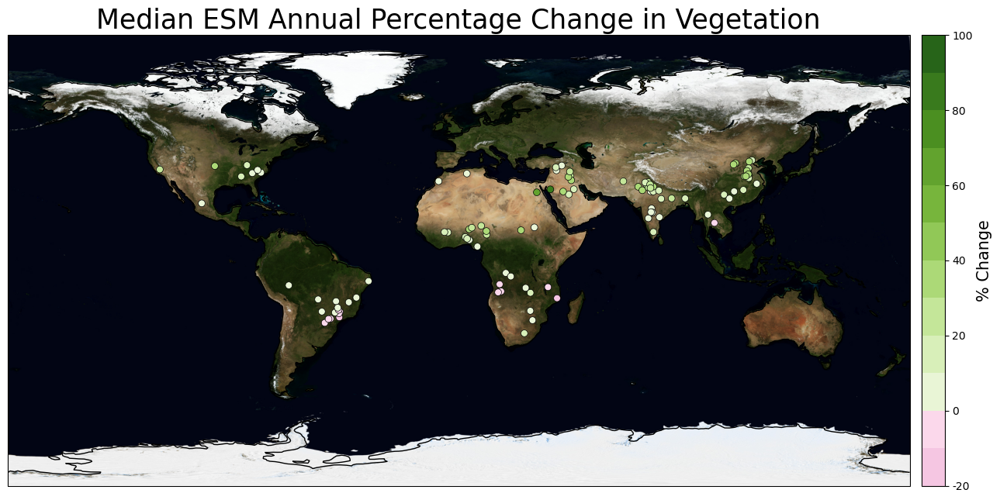

In [47]:
######## Fractional change in vegetation ###########

######## Median Change only plot with satellite BG #########

# create the colormap
scale_min = -20
scale_max = 100
cmap = cmap_crop  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 13)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
bounds_for_colorbar = np.linspace(scale_min, scale_max, 7)

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='Median ESM Annual Percentage Change in Vegetation')
ax.coastlines()
ax.background_img(name = 'BM')

im = ax.scatter(city_lons, city_lats, zorder=5, c=100*median_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '% Change', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds_for_colorbar, boundaries=bounds_for_colorbar, format='%1i')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'UEA','Urban_Heat','PROJECT','Writing_up','Paper','Key_Figures'))   
plt.savefig('bg_image_vegetation_perc_change_50_percentile.png', bbox_inches = 'tight', dpi = 300)

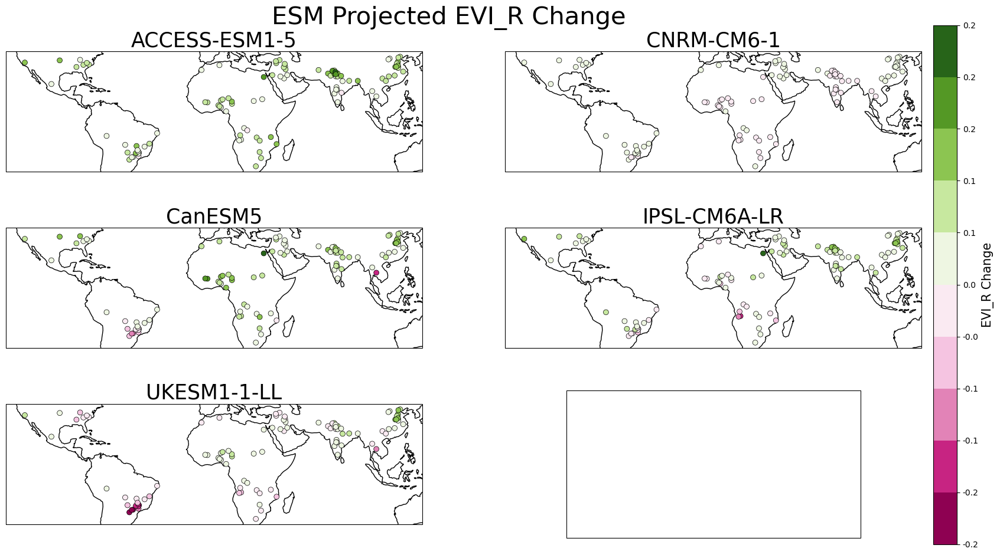

In [48]:
# Get the changes in EVI by multiplying the monthly EVIs by the fractional changes in LAIs

EVI_seasonal_cycle['Month'] = EVI_seasonal_cycle['month']
LAI_Proj_df3 = pd.merge(LAI_Proj_df2, EVI_seasonal_cycle, on = ['CITY_COUNTRY','Month'], how = 'left')
LAI_Proj_df3['EVI_R_Change'] = LAI_Proj_df3['LAI_fract_change']*LAI_Proj_df3['MONTH_MEAN_EVI_R']
LAI_Proj_df3['EVI_U_Change'] = LAI_Proj_df3['LAI_fract_change']*LAI_Proj_df3['MONTH_MEAN_EVI_U']
LAI_Proj_df3['EVI_D_Change'] = LAI_Proj_df3['LAI_fract_change']*LAI_Proj_df3['MONTH_MEAN_EVI_D']


#####################################################################
######## CHANGES FOR EACH EARTH SYSTEM MODEL ########################
#####################################################################

climate_var = 'EVI_R'
climate_var_units = ''

#plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=25)     # fontsize of the axes title
plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

# create the colormap
scale_min = -0.25
scale_max = 0.25
cmap = plt.cm.PiYG  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

cmap.set_over(color = 'black')

bounds = np.linspace(scale_min, scale_max, 11)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


#create the axes
fig, axes = plt.subplots(3,2 ,figsize=(20,11), subplot_kw={"projection": ccrs.PlateCarree()})

plt.suptitle('ESM Projected EVI_R Change', y = 0.93, fontsize = 30)

row_num = 0
col_num = 0
min_change = []
max_change = []
model_annual_change_df = pd.DataFrame()

for model in list(set(LAI_Proj_df3.Model)):
    
    model_df = LAI_Proj_df3[LAI_Proj_df3.Model == model].copy()
     
    df = model_df.groupby(['CITY_COUNTRY']).mean(numeric_only = True).reset_index()
    #CITY_COUNTRY_list = df.CITY_COUNTRY.values
    city_lats = df.Lat.values
    city_lons = df.Lon.values
    VAR_CHANGE = df['EVI_R_Change'].values
    
    axes[row_num,col_num].coastlines()
    im = axes[row_num,col_num].scatter(city_lons, city_lats, zorder=5, c=VAR_CHANGE, linewidths = 0.5,
                                        s =40,edgecolor = 'black',cmap= cmap, norm = norm)
    
    
    axes[row_num,col_num].set(title = model)  
    
    model_annual_df = pd.DataFrame({'CITY_COUNTRY': CITY_COUNTRY_list, 'Lat':city_lats, 'Lon':city_lons,
                                   'Annual_Mean_EVI_R_Change': VAR_CHANGE})
    model_annual_df['Model'] = model
    model_annual_change_df = pd.concat([model_annual_change_df, model_annual_df])
    # move the col and row nums on for the next plot
    if col_num == 1:
        col_num = 0
        row_num = row_num + 1
    
    elif col_num == 0:
        col_num = 1

#get size and extent of axes:
axpos = axes[1,1].get_position()
pos_x = axpos.x0 + axpos.width +0.01  #+ 0.25*axpos.width
pos_y = 0.1
cax_width = 0.02
cax_height = 0.8 #2*axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

fig.colorbar(im, cax = pos_cax,  label = 'EVI_R Change', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%.1f')   

In [49]:
model_annual_change_df.Annual_Mean_EVI_R_Change.min(),model_annual_change_df.Annual_Mean_EVI_R_Change.max()

(-0.23730982628201647, 0.22446432873689884)

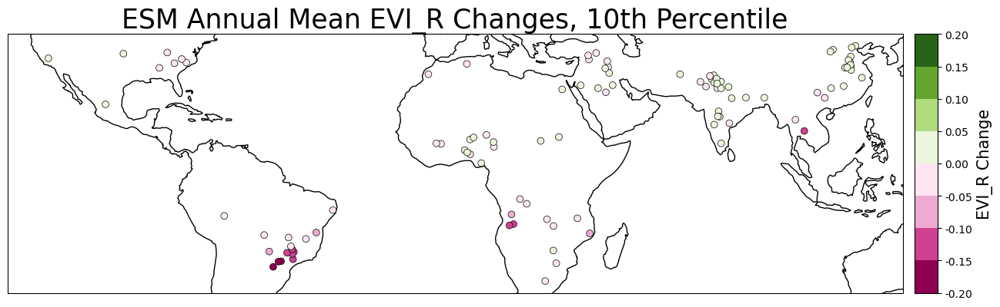

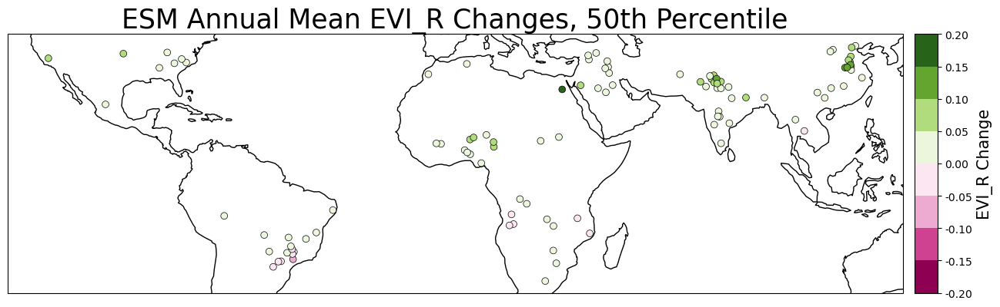

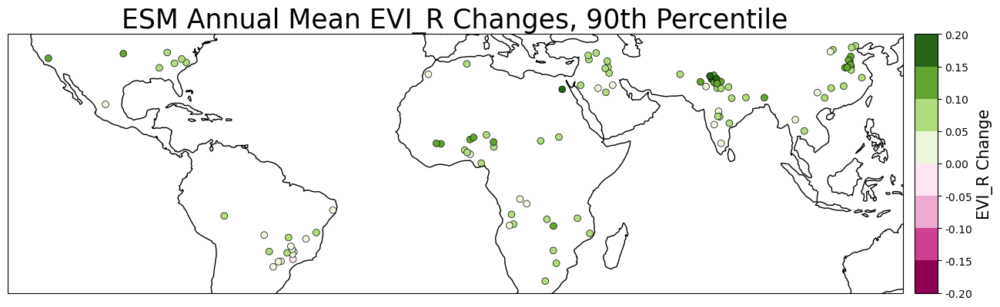

In [50]:
############################################################################
######## MODEL SPREAD: 10th, 50th, 90th Percentiles ########################
############################################################################

# get the median, 10th and 90th percentile changes
spread_df = pd.DataFrame ()
for i in range(len(CITY_COUNTRY_list)):
    CITY_COUNTRY = CITY_COUNTRY_list[i]
    var_changes = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].
                Annual_Mean_EVI_R_Change)
    lat = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lat.values[0])
    lon = (model_annual_change_df[model_annual_change_df['CITY_COUNTRY'] == CITY_COUNTRY].Lon.values[0])

    df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon], 
              'median_var_change':[np.percentile(var_changes, 50)],
              'ten_percentile_var_change':[np.percentile(var_changes, 10)],
              'ninety_percentile_var_change':[np.percentile(var_changes, 90)]}, index = [i])

    spread_df = pd.concat([spread_df, df])

# create the colormap
scale_min = -0.2
scale_max = 0.2
cmap = plt.cm.PiYG  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 9)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

city_lats = spread_df.Lat.values
city_lons = spread_df.Lon.values
median_var_change = spread_df.median_var_change.values
ten_percentile_var_change = spread_df.ten_percentile_var_change.values
ninety_percentile_var_change = spread_df.ninety_percentile_var_change.values

####################################
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean EVI_R Changes, 10th Percentile')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ten_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'EVI_R Change', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.2f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_10_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean EVI_R Changes, 50th Percentile')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=median_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'EVI_R Change', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.2f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_50_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), title='ESM Annual Mean EVI_R Changes, 90th Percentile')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ninety_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'EVI_R Change', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.2f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots'))   
plt.savefig('esm_{}_change_90_percentile.png'.format(climate_var), bbox_inches = 'tight')

In [59]:
##########################################################################
######## SUHI_MEAN CHANGES FOR EACH CLIMATE MODEL ########################
##########################################################################

# Use the RERF that has been refit on the entire dataset

model_name = 'RERF'
# read in the model 
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT', 'CITY_ADD_2022_09','All_cities_modelling'))
#filename = 'RERF_{}_{}.sav'.format(target_variable, test_train_split)
filename = 'REFIT_RERF_SUHI_MEAN.sav'
RERF_SUHI_MEAN = pickle.load(open(filename, 'rb'))

# generate a prediction for all the data
all_monthly_data_df2['RERF_SUHI_MEAN'] = RERF_SUHI_MEAN.predict(X_all_data_norm)

C:\Users\UEA_Laptop\.conda\envs\suhienv_sensitivity\lib\site-packages\sklearn\base.py:299: UserWarning: Trying to unpickle estimator Ridge from version 1.0.2 when using version 1.2.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\Users\UEA_Laptop\.conda\envs\suhienv_sensitivity\lib\site-packages\sklearn\base.py:299: UserWarning: Trying to unpickle estimator DecisionTreeRegressor from version 1.0.2 when using version 1.2.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
C:\Users\UEA_Laptop\.conda\envs\suhienv_sensitivity\lib\site-packages\sklearn\base.py:299: UserWarning: Trying to unpickle estimator RandomForestRegressor from version 1.0.2 when using v

In [80]:
## add the season into the dataset, so the warm season can be assessed

all_monthly_data_df2['Season'] = np.nan
for count, month in enumerate(all_monthly_data_df2.month):
    if month in [3,4,5]:
        all_monthly_data_df2.loc[count, 'Season'] = 'MAM'
    elif month in [6,7,8]:
        all_monthly_data_df2.loc[count, 'Season'] = 'JJA'
    elif month in [9,10,11]:
        all_monthly_data_df2.loc[count, 'Season'] = 'SON' 
    elif month in [12,1,2]:
        all_monthly_data_df2.loc[count, 'Season'] = 'DJF'

# group the means into 3 month changes
model_season_mean_pred_df = pd.DataFrame()

for model in list(set(LAI_Proj_df3.Model)):
    
    model_df = LAI_Proj_df3[LAI_Proj_df3.Model == model].copy()
    # data for the 2 degC climate change projections 
    climate_change_df = all_monthly_data_df2.copy()

    # merge and add in new RH and TP
    climate_change_df = pd.merge(climate_change_df, model_df, how = 'left', on = ['CITY_COUNTRY', 'month'])
    # copy the df to get the changes for RH and TP separately
    var_climate_change_df = climate_change_df.copy()

    var_climate_change_df['EVI_R'] = (var_climate_change_df['EVI_R'] 
                                          + var_climate_change_df['EVI_R_Change'])

        
    var_climate_change_df['EVI_U'] = (var_climate_change_df['EVI_U'] 
                                          + var_climate_change_df['EVI_U_Change'])
        
    var_climate_change_df['EVI_D'] = (var_climate_change_df['EVI_D'] 
                                          + var_climate_change_df['EVI_D_Change']) 
    
    #replace the values which go over the threshold amounts
    for climate_var in ['EVI_R','EVI_U']:
        var_climate_change_df.loc[var_climate_change_df[climate_var] > var_max_threshold, climate_var] = var_max_threshold
        var_climate_change_df.loc[var_climate_change_df[climate_var] < var_min_threshold, climate_var] = var_min_threshold       

    
    #calculate EVI_D again incase EVI_R has gone over 1 
    var_climate_change_df['EVI_D'] = var_climate_change_df['EVI_U'] - var_climate_change_df['EVI_R']
    
    #all evi changes
    X_cc_all_data = var_climate_change_df[predictor_variables]
    
    X_cc_all_data_norm = pd.DataFrame(scaler.transform(X_cc_all_data), 
                                         columns = X_cc_all_data.columns) #transform only
    
    var_climate_change_df['CC_PREDICTION'] = RERF_SUHI_MEAN.predict(X_cc_all_data_norm)
    
    var_climate_change_df['SUHI_CHANGE'] = (var_climate_change_df['CC_PREDICTION'] 
                                            - var_climate_change_df['RERF_SUHI_MEAN'])
     
    df = var_climate_change_df.groupby(['CITY_COUNTRY', 'Season']).mean(numeric_only = True).reset_index().copy()
    df_to_concat = df[['CITY_COUNTRY','Season','CC_PREDICTION','RERF_SUHI_MEAN','SUHI_CHANGE']].copy()
    
    df_to_concat['Model'] = model
    
    model_season_mean_pred_df = pd.concat([model_season_mean_pred_df, df_to_concat])
    
model_season_mean_pred_df = pd.merge(model_season_mean_pred_df, CITY_COUNTRY_lat_lon[['CITY_COUNTRY','Lat','Lon']],
                                     on = 'CITY_COUNTRY', how = 'left')

In [82]:
# get the median, 10th and 90th percentile changes for each season 
seasons = ['MAM','JJA','SON','DJF']
season_spread_df = pd.DataFrame ()

for i in range(len(CITY_COUNTRY_list)):
    CITY_COUNTRY = CITY_COUNTRY_list[i]
    lat = (model_annual_mean_pred_df[model_annual_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY].Lat.values[0])
    lon = (model_annual_mean_pred_df[model_annual_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY].Lon.values[0])
        
    for season in seasons:
        var_changes = (model_season_mean_pred_df[(model_season_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY)&
                                   (model_season_mean_pred_df['Season'] == season)].SUHI_CHANGE)

        if var_changes.size == 0:
            df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon],'Season':[season], 
                  'median_change':[np.nan],
                  'ten_percentile_change':[np.nan],
                  'ninety_percentile_change':[np.nan]}, index = [i])
        else:
            
            df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon],'Season':[season],
                  'median_change':[np.percentile(var_changes, 50)],
                  'ten_percentile_change':[np.percentile(var_changes, 10)],
                  'ninety_percentile_change':[np.percentile(var_changes, 90)]}, index = [i])

        season_spread_df = pd.concat([season_spread_df, df])


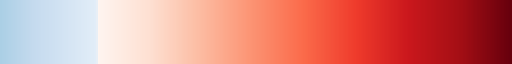

In [86]:
# creation of custom colormap so the white part is still centered on zero
cmap = plt.cm.Reds # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

cmap_low = plt.cm.Blues_r # define the colormap
# extract all colors from the .bwr map
cmaplist_low = [cmap_low(i) for i in range(cmap_low.N)]

# create the new map
cmap_low = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist_low, cmap_low.N)

length_colormap_low = int((256/0.6)-256)    

cmaplist_low2 = cmaplist_low[length_colormap_low:230]

lengthlow2 = length_colormap_low - (256-230)

# create the new map
#cmap_low2 = mpl.colors.LinearSegmentedColormap.from_list(
#    'Custom cmap', cmaplist_low2, cmap_low2.N)

cmaplist_all = (cmaplist_low2 + cmaplist)

cmap_all = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist_all, (lengthlow2 +cmap.N))

cmap_all

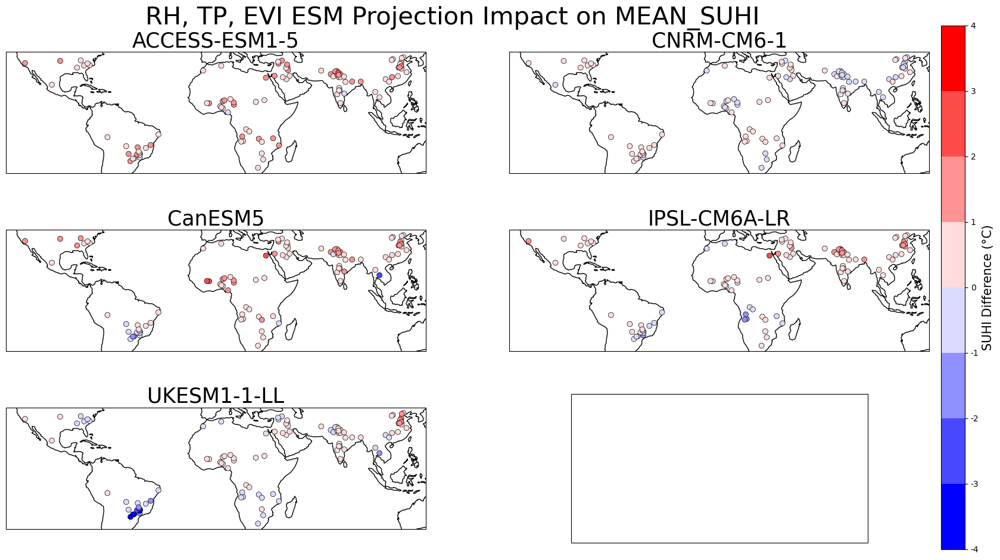

In [95]:
##############################################################
############ IMPACT OF ESM RH, TP, EVI CHANGES ###############
##############################################################

# make sure the normalisation is based on the training data 
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns) #fit and transform

var_max_threshold_evi = 1
var_min_threshold_evi = 0

var_max_threshold_rh_tp = 100
var_min_threshold_rh_tp = 0

# create the colormap
SUHI_MEAN_min = -4
SUHI_MEAN_max = 4
cmap = plt.cm.bwr  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

#cmap.set_under(color = 'black')

bounds = np.linspace(SUHI_MEAN_min, SUHI_MEAN_max, 9)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


#create the axes
fig, axes = plt.subplots(3,2 ,figsize=(20,11), subplot_kw={"projection": ccrs.PlateCarree()})

plt.suptitle('RH, TP, EVI ESM Projection Impact on MEAN_SUHI', y = 0.93, fontsize = 30)

row_num = 0
col_num = 0
min_change = []
max_change = []


model_annual_mean_pred_df = pd.DataFrame()

for model in list(set(LAI_Proj_df3.Model)):
    
    model_df = LAI_Proj_df3[LAI_Proj_df3.Model == model].copy()
    # data for the 2 degC climate change projections 
    climate_change_df = all_monthly_data_df2.copy()

    # merge and add in new RH and TP
    climate_change_df = pd.merge(climate_change_df, model_df, how = 'left', on = ['CITY_COUNTRY', 'month'])
    # copy the df to get the changes for RH and TP separately
    var_climate_change_df = climate_change_df.copy()

    var_climate_change_df['EVI_R'] = (var_climate_change_df['EVI_R'] 
                                          + var_climate_change_df['EVI_R_Change'])

        
    var_climate_change_df['EVI_U'] = (var_climate_change_df['EVI_U'] 
                                          + var_climate_change_df['EVI_U_Change'])
        
    var_climate_change_df['EVI_D'] = (var_climate_change_df['EVI_D'] 
                                          + var_climate_change_df['EVI_D_Change']) 
        
    var_climate_change_df['RH'] = (var_climate_change_df['RH'] 
                                          + var_climate_change_df['RH_Change'])
    
    var_climate_change_df['TP'] = (var_climate_change_df['TP'] 
                                          + var_climate_change_df['TP_Change'])
    
    #replace the values which go over the threshold amounts
    for climate_var in ['EVI_R','EVI_U']:
        var_climate_change_df.loc[var_climate_change_df[climate_var] > var_max_threshold_evi, climate_var] = var_max_threshold_evi
        var_climate_change_df.loc[var_climate_change_df[climate_var] < var_min_threshold_evi, climate_var] = var_min_threshold_evi       

    for climate_var in ['RH','TP']:
        var_climate_change_df.loc[var_climate_change_df[climate_var] > var_max_threshold_rh_tp, climate_var] = var_max_threshold_rh_tp
        var_climate_change_df.loc[var_climate_change_df[climate_var] < var_min_threshold_rh_tp, climate_var] = var_min_threshold_rh_tp       

    #calculate EVI_D again incase EVI_R has gone over 1 
    var_climate_change_df['EVI_D'] = var_climate_change_df['EVI_U'] - var_climate_change_df['EVI_R']
    
    
    #all evi changes
    X_cc_all_data = var_climate_change_df[predictor_variables]
    
    X_cc_all_data_norm = pd.DataFrame(scaler.transform(X_cc_all_data), 
                                         columns = X_cc_all_data.columns) #transform only
    
    var_climate_change_df['CC_PREDICTION'] = RERF_SUHI_MEAN.predict(X_cc_all_data_norm)
    
    var_climate_change_df['SUHI_CHANGE'] = (var_climate_change_df['CC_PREDICTION'] 
                                            - var_climate_change_df['RERF_SUHI_MEAN'])
     
    df = var_climate_change_df.groupby(['CITY_COUNTRY','Lat','Lon']).mean(numeric_only = True).reset_index()
    CITY_COUNTRY_list = df.CITY_COUNTRY.values
    city_lats = df.Lat.values
    city_lons = df.Lon.values
    SUHI_CHANGE = df.SUHI_CHANGE.values
    CC_PREDICTION = df.CC_PREDICTION.values
    
    model_annual_df = pd.DataFrame({'CITY_COUNTRY': CITY_COUNTRY_list, 'Lat':city_lats, 'Lon':city_lons,
                                   'Annual_Mean_SUHI_MEAN_change': SUHI_CHANGE,
                                    'Annual_Mean_SUHI_MEAN_CC': CC_PREDICTION})
    model_annual_df['Model'] = model
    model_annual_mean_pred_df = pd.concat([model_annual_mean_pred_df, model_annual_df])
    
    axes[row_num,col_num].coastlines()
    im = axes[row_num,col_num].scatter(city_lons, city_lats, zorder=5, c=SUHI_CHANGE, linewidths = 0.5,
                                        s =40,edgecolor = 'black',cmap= cmap, norm = norm)
    
    
    axes[row_num,col_num].set(title = model)
    
    min_change.append(SUHI_CHANGE.min())
    max_change.append(SUHI_CHANGE.max())            
    
    # move the col and row nums on for the next plot
    if col_num == 1:
        col_num = 0
        row_num = row_num + 1
    
    elif col_num == 0:
        col_num = 1

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width +0.01  #+ 0.25*axpos.width
pos_y = 0.1
cax_width = 0.02
cax_height = 0.8 #2*axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

fig.colorbar(im, cax = pos_cax,  label = 'SUHI Difference (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')   

In [96]:
model_annual_mean_pred_df.Annual_Mean_SUHI_MEAN_change.min(),model_annual_mean_pred_df.Annual_Mean_SUHI_MEAN_change.max()

(-3.562466356083551, 2.624218248106599)

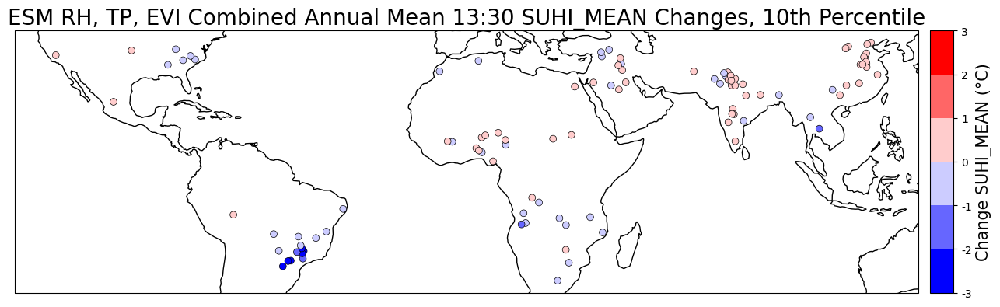

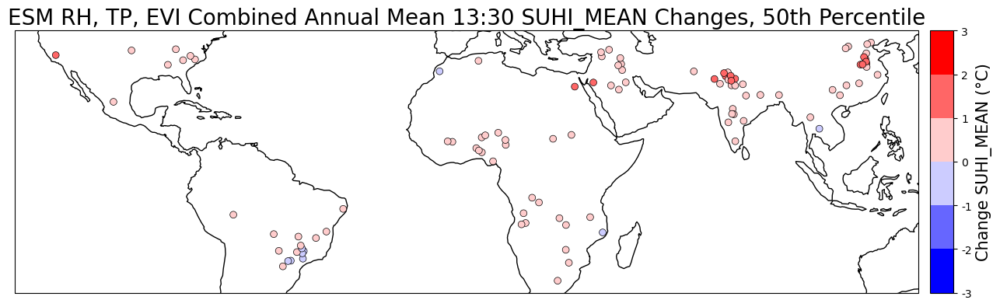

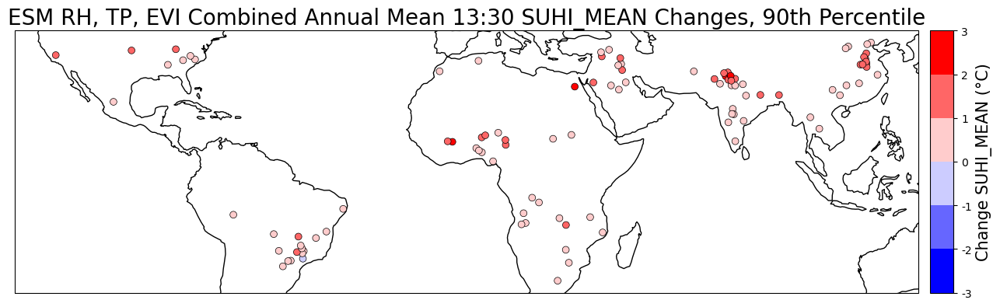

In [97]:
############################################################################
######## MODEL SPREAD: 10th, 50th, 90th Percentiles ########################
############################################################################
#plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

# get the median, 10th and 90th percentile changes
spread_df = pd.DataFrame ()
for i in range(len(CITY_COUNTRY_list)):
    CITY_COUNTRY = CITY_COUNTRY_list[i]
    var_changes = (model_annual_mean_pred_df[model_annual_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY].
                Annual_Mean_SUHI_MEAN_change)
    
    lat = (model_annual_mean_pred_df[model_annual_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY].Lat.values[0])
    lon = (model_annual_mean_pred_df[model_annual_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY].Lon.values[0])

    df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon], 
              'median_var_change':[np.percentile(var_changes, 50)],
              'ten_percentile_var_change':[np.percentile(var_changes, 10)],
              'ninety_percentile_var_change':[np.percentile(var_changes, 90)]}, index = [i])

    spread_df = pd.concat([spread_df, df])

# create the colormap
scale_min = -3
scale_max = 3
cmap = plt.cm.bwr  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 7)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

city_lats = spread_df.Lat.values
city_lons = spread_df.Lon.values
median_var_change = spread_df.median_var_change.values
ten_percentile_var_change = spread_df.ten_percentile_var_change.values
ninety_percentile_var_change = spread_df.ninety_percentile_var_change.values

####################################
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='ESM RH, TP, EVI Combined Annual Mean 13:30 SUHI_MEAN Changes, 10th Percentile')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ten_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'Change SUHI_MEAN (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes'))   
plt.savefig('esm_rh_tp_evi_suhi_mean_change_10_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='ESM RH, TP, EVI Combined Annual Mean 13:30 SUHI_MEAN Changes, 50th Percentile')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=median_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'Change SUHI_MEAN (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes'))   
plt.savefig('esm_rh_tp_evi_suhi_mean_change_50_percentile.png'.format(climate_var), bbox_inches = 'tight')
####################################

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='ESM RH, TP, EVI Combined Annual Mean 13:30 SUHI_MEAN Changes, 90th Percentile')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=ninety_percentile_var_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'Change SUHI_MEAN (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes'))   
plt.savefig('esm_rh_tp_evi_suhi_mean_change_90_percentile.png', bbox_inches = 'tight')

In [98]:
spread_df.ten_percentile_var_change.min(), spread_df.ninety_percentile_var_change.max()

(-2.672442804714769, 2.3057566882331915)

In [106]:
#### Getting the data into the right format for the horizontal bar chart showing before/ after 2 degC warming

group = all_monthly_data_df2[all_monthly_data_df2.year > 2002].groupby(['CITY_COUNTRY']).mean(numeric_only = True).reset_index(
                )[['CITY_COUNTRY','T2M','SUHI_MEAN']]

suhi_t2m_clim_proj_df = pd.merge(group, spread_df, on = ['CITY_COUNTRY'],how = 'left')

#sort by SUHI MEAN
suhi_t2m_clim_proj_df = suhi_t2m_clim_proj_df.sort_values(by = 'SUHI_MEAN', ascending=False)

#add name for plotting
for i in range(len(CITY_COUNTRY_lat_lon)):
    CITY_COUNTRY = CITY_COUNTRY_lat_lon['CITY_COUNTRY'][i] 
    city_lab = CITY_COUNTRY_lat_lon['City'][i]  + ', ' + CITY_COUNTRY_lat_lon['Country'][i] 
    suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY, 'City, Country']=city_lab



suhi_t2m_clim_proj_df['SUHI_MEAN with Climate Change'] = (suhi_t2m_clim_proj_df['SUHI_MEAN']+
                                                          suhi_t2m_clim_proj_df['median_var_change'])

for CITY_COUNTRY in suhi_t2m_clim_proj_df.CITY_COUNTRY:
    suhi_before_cc = suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY]['SUHI_MEAN'].values[0]
    
    if suhi_before_cc < 0:
        suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY,
                              'SUHI_MEAN before Climate Change2'] = suhi_before_cc
    else:
        suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY,'SUHI_MEAN before Climate Change2'] = 0
        
for CITY_COUNTRY in suhi_t2m_clim_proj_df.CITY_COUNTRY:
    suhi_before_cc = suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY]['SUHI_MEAN'].values[0]
    
    if suhi_before_cc > 0:
        suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY,
                              'SUHI_MEAN before Climate Change3'] = suhi_before_cc
    else:
        suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY,'SUHI_MEAN before Climate Change3'] = 0

# postive suhis which have a decrease in suhi with cc
for CITY_COUNTRY in suhi_t2m_clim_proj_df.CITY_COUNTRY:
    suhi_after_cc = suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY]['SUHI_MEAN with Climate Change'].values[0]
    med_change = suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY]['median_var_change'].values[0]
    
    if med_change < 0:
        suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY,
                              'SUHI_MEAN med change neg'] = suhi_after_cc
    else:
        suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY,'SUHI_MEAN med change neg'] = 0        

In [107]:
###### Prediction errors #########

from sklearn.metrics import mean_squared_error

def calc_pred_error_unknown_obvs(y_obs, y_pred_obs, y0):
    mse = mean_squared_error(y_obs, y_pred_obs) # calculate the mean squared error
    n = len(y_pred_obs)
    mean_pred = np.mean(y_pred_obs)
    
    stderr = mse*(1+1/float(n)+(y0 - mean_pred)**2/np.sum((y_pred_obs - mean_pred)**2))
    pred_interval = np.sqrt(stderr)
    return pred_interval

def calc_pred_error(y, y_pred):                                       
    mse = mean_squared_error(y, y_pred) # calculate the mean squared error
    n = len(y_pred)
    mean_pred = np.mean(y_pred)
    y_pred_interval = []
    for y0 in y_pred:
        stderr = mse*(1+1/float(n)+(y0 - mean_pred)**2/np.sum((y_pred - mean_pred)**2))
        pred_interval = np.sqrt(stderr)
        y_pred_interval.append(pred_interval)
    return y_pred_interval

# annual pred errors
year_group = all_monthly_data_df2[all_monthly_data_df2.year > 2002].groupby(['CITY_COUNTRY','year']
                                                                ).mean(numeric_only=True).reset_index()

pred_intervals = []
y_obs = year_group.SUHI_MEAN.values
y_pred_obs = year_group.RERF_SUHI_MEAN.values

for y0 in year_group.SUHI_MEAN.values:
    pred_err_calc = calc_pred_error_unknown_obvs(y_obs, y_pred_obs, y0)
    pred_intervals.append(pred_err_calc)
    
print('annual overall pred error', min(pred_intervals),'to',max(pred_intervals))

# city specific PIs
city_mean_pi = []
city_pi2 = []
city = []

for CITY_COUNTRY in CITY_COUNTRY_lat_lon.CITY_COUNTRY: 

    pred_intervals = []
    y_obs = year_group[year_group.CITY_COUNTRY == CITY_COUNTRY].SUHI_MEAN.values
    y_pred_obs = year_group[year_group.CITY_COUNTRY == CITY_COUNTRY].RERF_SUHI_MEAN.values

    for y0 in year_group[year_group.CITY_COUNTRY == CITY_COUNTRY].SUHI_MEAN.values:
        pred_err_calc = calc_pred_error_unknown_obvs(y_obs, y_pred_obs, y0)
        pred_intervals.append(pred_err_calc)
        
    pred_error1 = calc_pred_error(y_obs,y_pred_obs)
        
    city_mean_pi.append(np.mean(pred_intervals))
    city_pi2.append(np.mean(pred_error1))
    city.append(CITY_COUNTRY)
    
pi_df = pd.DataFrame({'CITY_COUNTRY':city, 'Mean_PI':city_mean_pi, 'Mean_PI_2':city_pi2})

pi_df = pd.merge(pi_df, CITY_COUNTRY_lat_lon[['CITY_COUNTRY','Lat','Lon']], on = 'CITY_COUNTRY')    

annual overall pred error 0.5605909167157079 to 0.5625394081278361


In [108]:
import seaborn as sns

In [109]:
suhi_t2m_clim_proj_df = pd.merge(suhi_t2m_clim_proj_df, pi_df[['CITY_COUNTRY','Mean_PI_2']], on = 'CITY_COUNTRY', 
                                 how = 'left')

suhi_t2m_clim_proj_df['low_pi'] = (suhi_t2m_clim_proj_df['SUHI_MEAN with Climate Change']-
                                   suhi_t2m_clim_proj_df['Mean_PI_2'])
suhi_t2m_clim_proj_df['upper_pi'] = (suhi_t2m_clim_proj_df['SUHI_MEAN with Climate Change']+
                                    suhi_t2m_clim_proj_df['Mean_PI_2'])


In [111]:
## Grouping the cities into location categories

north_america = ['GREENVILLE_USA','BIRMINGHAM_USA', 'LEXINGTON_FAYETTE_USA','VISALIA_USA', 'FAYETTEVILLE_USA',
       'WINSTON_SALEM_USA','WICHITA_USA']

south_america = ['MONTES_CLAROS_BRAZIL', 'RIBEIRAO_BRAZIL', 'UBERLANDIA_BRAZIL', 'SAO_JOSE_DO_RIO_PRETO_BRAZIL',
                 'RIO_BRANCO_BRAZIL', 'ANAPOLIS_BRAZIL', 'UBERABA_BRAZIL', 'FRANCA_BRAZIL', 'CUIABA_BRAZIL', 
                 'PIRACICABA_BRAZIL', 'LONDRINA_BRAZIL',  'CASCAVEL_BRAZIL','CARUARU_BRAZIL','MARINGA_BRAZIL', 
                 'VITORIA_DA_CONQUISTA_BRAZIL', 'CAMPO_GRANDE_BRAZIL','ZACATECAS_MEXICO']

subsaharan_africa= ['OGBOMOSHO_NIGERIA', 'UMUAHIA_NIGERIA', 'LIKASI_DMRC','NDOLA_ZAMBIA', 'MALANJE_ANGOLA',
                    'PARAKOU_BENIN','KIKWIT_DMRC', 'SAKI_NIGERIA', 'SIKASSO_MALI', 'BULAWAYO_ZIMBABWE', 
                    'SONGEA_TANZANIA','BOBO_DIOULASSO_BURKINA_FASO',  'TSHIKAPA_DMRC', 'NAMPULA_MOZAMBIQUE',
                    'POLOKWANE_SOUTH_AFRICA', 'HUAMBO_ANGOLA', 'CUITO_ANGOLA', 'GOMBE_NIGERIA',
                   'BIRNIN_KEBBI_NIGERIA','POTISKUM_NIGERIA', 'ZINDER_NIGER', 'SOKOTO_NIGERIA',  
                    'BLOEMFONTEIN_SOUTH_AFRICA']

middle_east = ['FALOOJAH_IRAQ', 'BAAQOOBAH_IRAQ','AL_RAQQA_SYRIA',   'HAFAR_AL_BATIN_SAUDI_ARABIA','HA_IL_SAUDI_ARABIA',
       'BATMAN_TURKEY',  'DIWANIYAH_IRAQ','KIRKUK_IRAQ', 'SANLIURFA_TURKEY', 'KANDAHAR_AFGHANISTAN', 
     'TABUK_SAUDI_ARABIA',   'BURAYDAH_SAUDI_ARABIA']

north_africa = [ 'ASYUT_EGYPT','MARRARECH_MOROCCO',  'EL_DJELFA_ALGERIA' 'AL_OBEID_SUDAN','NYALA_SUDAN']

south_east_asia = ['LAMPANG_THAILAND','NAKHON_RATCHASIMA_THAILAND']
south_asia = [ 'MUZAFFARNAGAR_INDIA', 'PATIALA_INDIA',  'BATHINDA_INDIA', 'JALANDHAR_INDIA', 'KASUR_PAKISTAN', 
              'ROHTAK_INDIA', 'SHAHJAHANPUR_INDIA','MYMENSINGH_BANGLADESH',  'MATHURA_INDIA', 'GAYA_INDIA',
              'ERODE_INDIA', 'HISAR_INDIA', 'BAHAWALPUR_PAKISTAN','NANDED_WAGHALA_INDIA', 'ALWAR_INDIA',
       'KHAMMAM_INDIA', 'SATNA_INDIA','BIKANER_INDIA','PARBHANI_INDIA','BIJAPUR_INDIA', 'AKOLA_INDIA']

east_asia = [ 'HUAIHUA_CHINA','LIUYANG_CHINA', 'HECHI_CHINA','NINGGUO_CHINA','SHANGQIU_CHINA','LUOHE_CHINA',
             'LINQING_CHINA', 'ZHOUKOU_CHINA', 'HEZE_CHINA','FUYANG_CHINA', 'ANSHUN_CHINA', 'PUYANG_CHINA', 
             'ZHUOZHOU_CHINA', 'BOZHOU_CHINA', 'SANHE_CHINA','YULIN_SHAANXI_CHINA', 'SHENMU_CHINA']


for CITY_COUNTRY in suhi_t2m_clim_proj_df.CITY_COUNTRY.values:
    if CITY_COUNTRY in north_america:
        city_region = 'North America'
    elif CITY_COUNTRY in south_america:
        city_region = 'South America'
    elif CITY_COUNTRY in subsaharan_africa:
        city_region = 'Subsaharan Africa'
    elif CITY_COUNTRY in north_africa:
        city_region = 'North Africa'
    elif CITY_COUNTRY in middle_east:
        city_region = 'Middle East'
    elif CITY_COUNTRY in south_east_asia:
        city_region = 'South East Asia'
    elif CITY_COUNTRY in south_asia:
        city_region = 'South Asia'
    elif CITY_COUNTRY in east_asia:
        city_region = 'East Asia'
    
    suhi_t2m_clim_proj_df.loc[suhi_t2m_clim_proj_df.CITY_COUNTRY == CITY_COUNTRY, 'City_Region'] = city_region
    

In [113]:
suhi_t2m_clim_proj_df['Region_Position'] = -6

C:\Users\UEA_Laptop\.conda\envs\suhienv_sensitivity\lib\site-packages\seaborn\categorical.py:1680: UserWarning: You passed a edgecolor/edgecolors ([(0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0

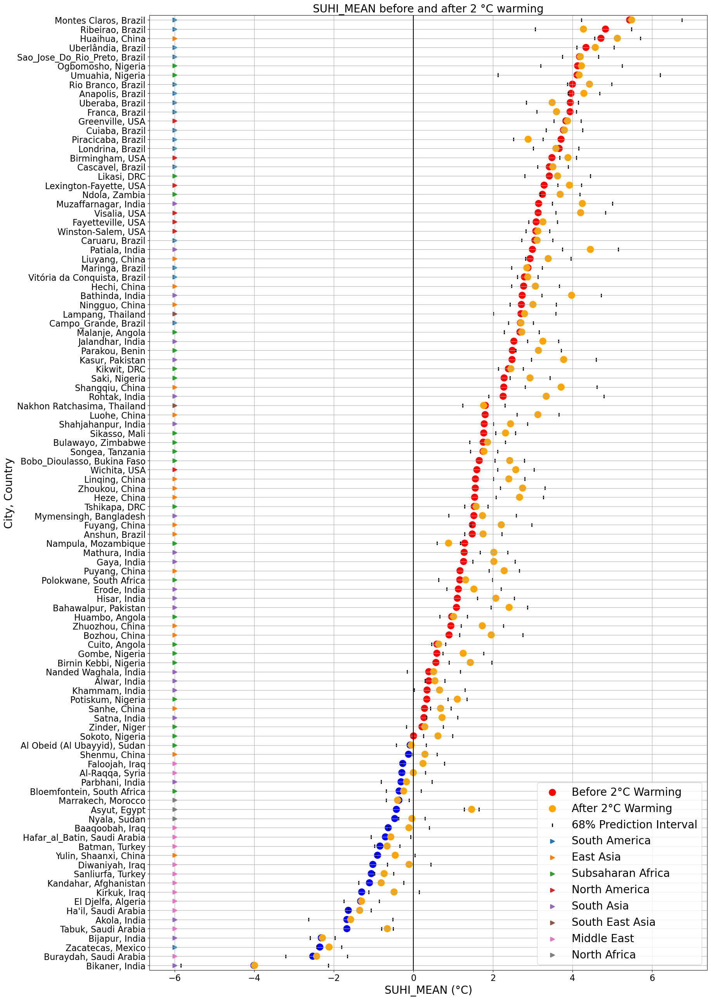

In [114]:
# circle plots

#set the font sizes
plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels
plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title

fig, axes = plt.subplots(1,1, figsize = (20, 30))
fig.tight_layout(pad=15.0)
#fig.suptitle("Peak Magnitude")
#plt.subplots_adjust(top=0.94) # move subplot title position

#import the required package for normalising 
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

#clrs = ['grey' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

clrs = ['blue' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

clrs2 = ['blue' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

#markers = ["o","s","p","h","D","H" ,"d", "P"],
sns.pointplot(x='SUHI_MEAN', y='City, Country', 
            data=suhi_t2m_clim_proj_df,palette = clrs,
            label="Before 2\u00b0C Warming", join = False, scale=1.5)

sns.pointplot(x='SUHI_MEAN with Climate Change', y='City, Country', 
            data=suhi_t2m_clim_proj_df,
            label="After 2\u00b0C Warming", color = 'orange', join = False, scale=1.5 )


sns.pointplot(x='low_pi', y='City, Country', 
            data=suhi_t2m_clim_proj_df, markers = '|',color = 'k',
            label="68% Prediction Interval", join = False, scale=1)

sns.pointplot(x='upper_pi', y='City, Country', 
            data=suhi_t2m_clim_proj_df, markers = '|',color = 'k',
             join = False, scale=1)


sns.pointplot(x='Region_Position', y='City, Country', 
            data=suhi_t2m_clim_proj_df,hue = 'City_Region',markers = '>',
            label="City Region", join = False, scale=1)

#Mean_PI_2

# again for change in neg suhi
#sns.set_color_codes("pastel")
#sns.pointplot(x='SUHI_MEAN before Climate Change2', y='City, Country', 
#            data=suhi_t2m_clim_proj_df,
#            label="Before 2\u00b0C Warming (Negative)", color='blue')

# positive changes due to cc
#sns.set_color_codes("pastel")
#sns.barplot(x='SUHI_MEAN with Climate Change', y='City, Country', 
#            data=suhi_t2m_clim_proj_df,
#            label="After 2\u00b0C Warming", color='orange')

#sns.barplot(x='SUHI_MEAN before Climate Change3', y='City, Country', 
#            data=suhi_t2m_clim_proj_df,
#            label="Before 2\u00b0C Warming (Positive)", color='red')

#sns.barplot(x='SUHI_MEAN med change neg', y='City, Country', 
#            data=suhi_t2m_clim_proj_df,
#             color='orange')

axes.axvline(0, color = 'k')

axes.set(xlabel = 'SUHI_MEAN (\u00b0C)', title = 'SUHI_MEAN before and after 2 \u00b0C warming')
axes.legend(loc = 4)
axes.grid()
#save plot
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes')) 
plt.savefig('suhi_w_cc_all_cities.png', bbox_inches = 'tight')

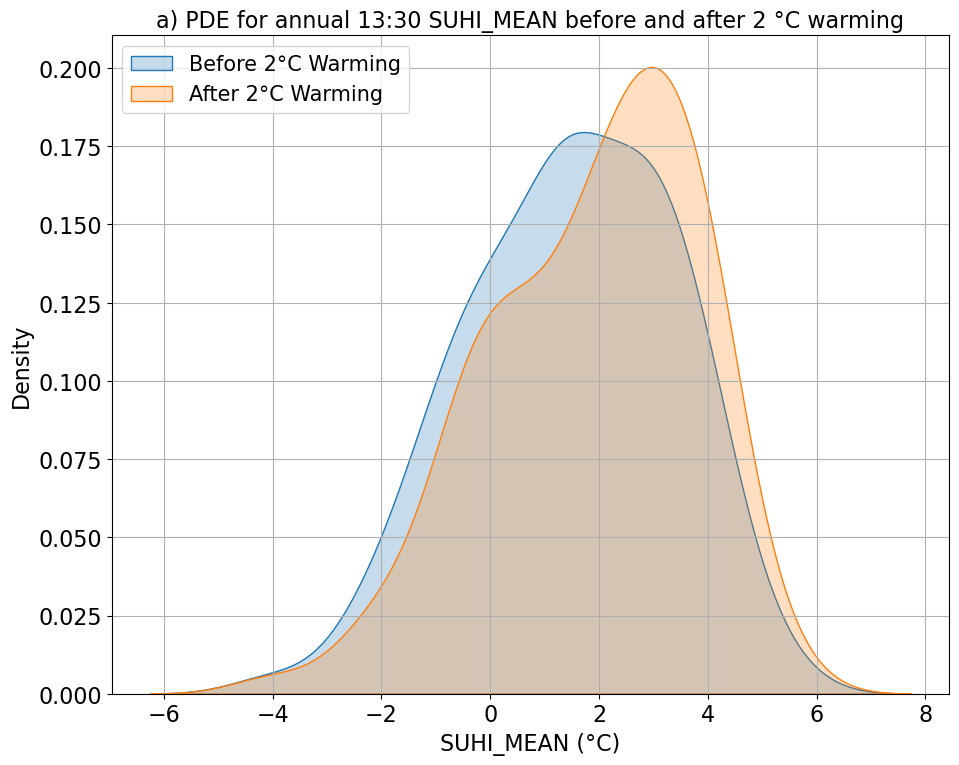

In [115]:
###########################################################
############# Kernal Density Estimation Plots #############
###########################################################
#set the font sizes
plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=16)     # fontsize of the axes title
plt.rc('axes', labelsize=16)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels
plt.rc('legend', fontsize=15)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

fig, axes = plt.subplots(1,1, figsize = (14, 12))
fig.tight_layout(pad=15.0)

sns.kdeplot(data=suhi_t2m_clim_proj_df, x="SUHI_MEAN", label="Before 2\u00b0C Warming", fill = True)

sns.kdeplot(data=suhi_t2m_clim_proj_df, x="SUHI_MEAN with Climate Change", label="After 2\u00b0C Warming", fill = True)


axes.set(xlabel = 'SUHI_MEAN (\u00b0C)', title = 'a) PDE for annual 13:30 SUHI_MEAN before and after 2 \u00b0C warming')
axes.legend(loc = 2)
axes.grid()


#save plot
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes')) 
plt.savefig('KDE_plot_city_annual_means.png', bbox_inches = 'tight')

In [116]:
###################################################################
## Perform a t-test to see significance of change in annual mean ##
###################################################################

before = suhi_t2m_clim_proj_df['SUHI_MEAN'].values
after = suhi_t2m_clim_proj_df['SUHI_MEAN with Climate Change'].values

# t test to find whether the after is greater than the before
# alternative hypothesis is that the mean of the first sample is less than the mean of the second sample
print(stats.ttest_ind(before, after, alternative = 'less') )

print('Mean before',np.mean(before),'Mean after',np.mean(after))
print('Increase in mean',np.mean(after)-np.mean(before))

# t-test on related samples
stats.ttest_rel(before, after, alternative = 'less') 

Ttest_indResult(statistic=-1.565632786601076, pvalue=0.05948472634662045)
Mean before 1.4646609129455828 Mean after 1.8771127800076663
Increase in mean 0.4124518670620836


TtestResult(statistic=-8.833573998181812, pvalue=1.4374424807270875e-14, df=103)

In [122]:
#### Adding in region LST changes
LST_Proj_df['LST_Change'] = LST_Proj_df['LST_Proj']-LST_Proj_df['LST_Preind']
model_annual_LST_df = LST_Proj_df.groupby(['CITY_COUNTRY','Model']).mean(numeric_only = True).reset_index()
median_annual_LST_df = model_annual_LST_df.groupby(['CITY_COUNTRY']).median(numeric_only = True).reset_index()

# add in the median change in LST to main ds
suhi_t2m_clim_proj_df = pd.merge(suhi_t2m_clim_proj_df, median_annual_LST_df[['CITY_COUNTRY','LST_Change']], 
                                 on = 'CITY_COUNTRY', how = 'left')

# add in the change in LST plus SUHI change and prediction intervals
suhi_t2m_clim_proj_df['LST_Change_plus_SUHI_Change']= (suhi_t2m_clim_proj_df['LST_Change']+
                                                       suhi_t2m_clim_proj_df['median_var_change'])

suhi_t2m_clim_proj_df['lst_suhi_change_low_pi'] = (suhi_t2m_clim_proj_df['LST_Change_plus_SUHI_Change']-
                                   suhi_t2m_clim_proj_df['Mean_PI_2'])
suhi_t2m_clim_proj_df['lst_suhi_change_upper_pi'] = (suhi_t2m_clim_proj_df['LST_Change_plus_SUHI_Change']+
                                    suhi_t2m_clim_proj_df['Mean_PI_2'])

# order by LST change, highest to lowest
LST_ordered_suhi_t2m_clim_proj_df = suhi_t2m_clim_proj_df.copy()
LST_ordered_suhi_t2m_clim_proj_df = LST_ordered_suhi_t2m_clim_proj_df.sort_values(by = 'LST_Change',ascending=False)

#postition for the region arrows to go
LST_ordered_suhi_t2m_clim_proj_df['Region_Position2']=-1

C:\Users\UEA_Laptop\.conda\envs\suhienv_sensitivity\lib\site-packages\seaborn\categorical.py:1680: UserWarning: You passed a edgecolor/edgecolors ([(0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0

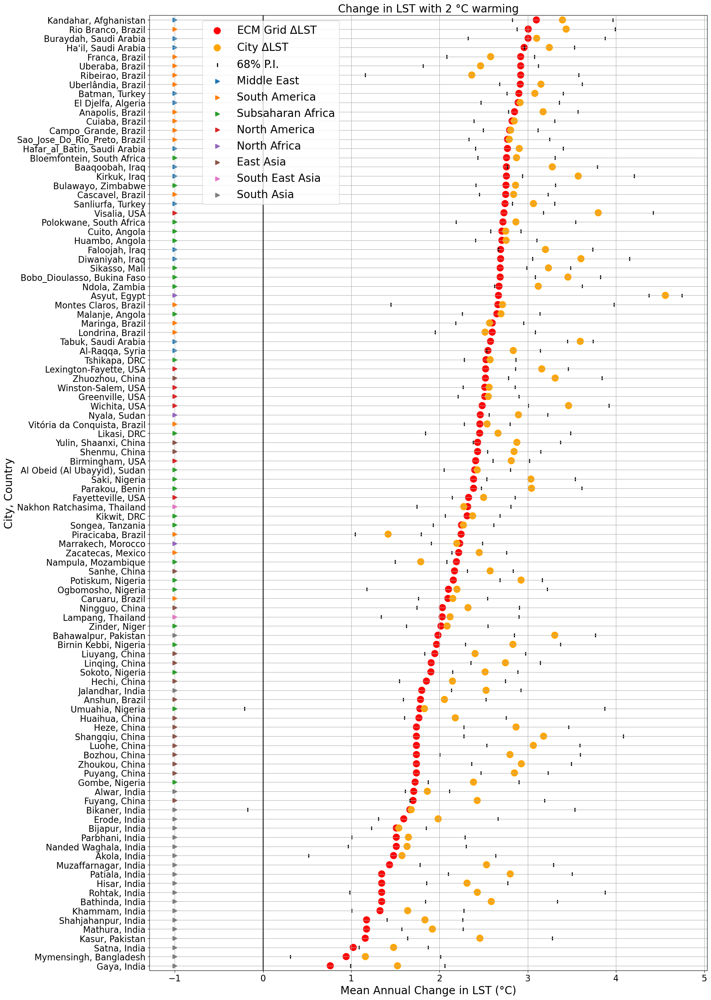

In [124]:
# circle plots

#set the font sizes
plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels
plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title

fig, axes = plt.subplots(1,1, figsize = (20, 30))
fig.tight_layout(pad=15.0)
#fig.suptitle("Peak Magnitude")
#plt.subplots_adjust(top=0.94) # move subplot title position

#import the required package for normalising 
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

#clrs = ['blue' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

#clrs2 = ['blue' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

#markers = ["o","s","p","h","D","H" ,"d", "P"],
sns.pointplot(x='LST_Change', y='City, Country', 
            data=LST_ordered_suhi_t2m_clim_proj_df,color = 'red',
            label= r'ECM Grid $\Delta$LST', join = False, scale=1.5)

sns.pointplot(x='LST_Change_plus_SUHI_Change', y='City, Country', 
            data=LST_ordered_suhi_t2m_clim_proj_df,
            label="City $\Delta$LST", color = 'orange', join = False, scale=1.5 )


sns.pointplot(x='lst_suhi_change_low_pi', y='City, Country', 
            data=LST_ordered_suhi_t2m_clim_proj_df, markers = '|',color = 'k',
            label="68% P.I.", join = False, scale=1)

sns.pointplot(x='lst_suhi_change_upper_pi', y='City, Country', 
            data=LST_ordered_suhi_t2m_clim_proj_df, markers = '|',color = 'k',
             join = False, scale=1)


sns.pointplot(x='Region_Position2', y='City, Country', 
            data=LST_ordered_suhi_t2m_clim_proj_df,hue = 'City_Region',markers = '>',
            label="City Region", join = False, scale=1)

axes.axvline(0, color = 'k')

axes.set(xlabel = 'Mean Annual Change in LST (\u00b0C)', title = 'Change in LST with 2 \u00b0C warming')
axes.legend(loc = 1,bbox_to_anchor=(0.35,1))
axes.grid()
#save plot
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes')) 
plt.savefig('lst_plus_suhi_w_cc_all_cities.png', bbox_inches = 'tight')

In [128]:
# add in percentage change above the ESM that including the SUHI change creates
suhi_t2m_clim_proj_df['Additional_percent_increase_above_esm'] = 100*((suhi_t2m_clim_proj_df.LST_Change_plus_SUHI_Change
                                                                  /suhi_t2m_clim_proj_df.LST_Change)-1)

# print out some stats
print('percentage >3 deg LST change', 100*len(suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.LST_Change >3]
                                             )/104)

print('percentage >3 deg LST change+SUHI', 100*len(suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.LST_Change_plus_SUHI_Change >3]
                                             )/104)

print('num cities >3 deg LST change', len(suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.LST_Change >3]))
                                             

print('num cities >3 deg LST change+SUHI', len(suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.LST_Change_plus_SUHI_Change>3]))

print('num cities >2 deg LST change', len(suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.LST_Change >2]))
                                             

print('num cities >2 deg LST change+SUHI', len(suhi_t2m_clim_proj_df[suhi_t2m_clim_proj_df.LST_Change_plus_SUHI_Change>2]))

print('mean region LST change', suhi_t2m_clim_proj_df.LST_Change.mean())
print('mean region LST+SUHI change', suhi_t2m_clim_proj_df.LST_Change_plus_SUHI_Change.mean())

percentage >3 deg LST change 2.8846153846153846
percentage >3 deg LST change+SUHI 25.0
num cities >3 deg LST change 3
num cities >3 deg LST change+SUHI 26
num cities >2 deg LST change 67
num cities >2 deg LST change+SUHI 88
mean region LST change 2.212989
mean region LST+SUHI change 2.6254410208323833


In [129]:
# read in the dataset woth the global ESM LST changes, to be used as a map background 
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Climate_Model_Projections'))       
LST_changes_ds = xr.open_dataset('LST_changes_ds.nc')

In [130]:
# crop out the upper 40N lat as it is not needed
# change coords to -180 to 180 for easier cropping
LST_changes_ds = LST_changes_ds.assign_coords(lon=(((LST_changes_ds.lon - 180) % 360) - 180))
LST_changes_ds = LST_changes_ds.sortby(LST_changes_ds.lon) #reorder 

LST_changes_ds = LST_changes_ds.where((LST_changes_ds.lat <= 50)&(LST_changes_ds.lat >= -45)
                                      &(LST_changes_ds.lon <= 132)&(LST_changes_ds.lon >= -130), drop = True)

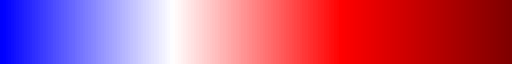

In [131]:
# creation of custom colormap so the white part is still centered on zero
cmap = plt.cm.seismic # define the colormap
cmaplist = [cmap(i) for i in range(cmap.N)]
cmaplist_crop = cmaplist[63:] # list is 256, so cutting off a lower quarter
cmap_crop = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist_crop, len(cmaplist_crop))

cmap_crop

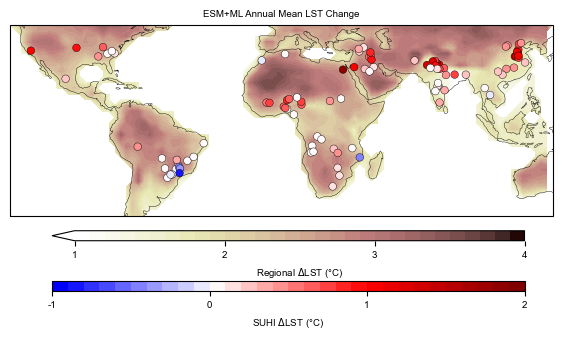

In [135]:
####################################
plt.rc('font', size=7)          # controls default text sizes
plt.rc('axes', titlesize=7)     # fontsize of the axes title
#plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=7)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
#plt.rc('figure', titlesize=20)  # fontsize of the figure title
plt.rcParams["font.family"] = "arial"


esm_lats = LST_changes_ds.lat
esm_lons = LST_changes_ds.lon
esm_lst_change = LST_changes_ds.Median_LST_change

esm_lst_change, esm_lons = add_cyclic_point(esm_lst_change, coord=esm_lons)

city_lats = suhi_t2m_clim_proj_df.Lat.values
city_lons = suhi_t2m_clim_proj_df.Lon.values
lst_change = suhi_t2m_clim_proj_df.LST_Change.values
lst_plus_suhi_change = suhi_t2m_clim_proj_df.LST_Change_plus_SUHI_Change.values
suhi_change = suhi_t2m_clim_proj_df.median_var_change.values

fig = plt.figure(figsize=(7,5))
ax = plt.axes(projection=ccrs.PlateCarree(), 
             title='ESM+ML Annual Mean LST Change')
ax.coastlines(linewidth=0.3)
#ax.background_img(name = 'BM')

# create the colormap for esm lst changes
scale_min = 1
scale_max = 4
cmap = plt.cm.pink_r.copy()  # define the colormap
#cmap = plt.cm.hot_r
#cmap = plt.cm.plasma_r
#cmap = plt.cm.viridis.copy()

# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]
cmap.set_under(cmaplist[0])
# create the new map
#cmap = mpl.colors.LinearSegmentedColormap.from_list(
#    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 31) # 40 for continuous cbar, 17 for 1 to 5 scale
bounds_for_colorbar = np.linspace(scale_min, scale_max, 4) #5 for 1 to 5 scale
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)


#coord system to plot on
coord=ccrs.PlateCarree()
esm_im = ax.contourf(esm_lons,esm_lats,esm_lst_change,transform=coord, cmap=cmap, levels = bounds, extend = 'min',
                    norm = norm) 

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 +0.06 #+ axpos.width + 0.07 #+ 0.25*axpos.width
pos_y = axpos.y0 -0.05
cax_width = axpos.width -0.1
cax_height = 0.02#- 0.3
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(esm_im, cax=pos_cax, cmap= cmap, norm = norm ,spacing='proportional' ,  ticks=bounds_for_colorbar, 
    boundaries=bounds, format='%1i',orientation='horizontal').set_label(label = 'Regional $\Delta$LST (\u00b0C)', size=7)


# create a new colormap, as the range is smaller for the suhi change only 
scale_min = -1
scale_max = 2
cmap = cmap_crop

# extract all colors from the .bwr map
cmaplist = [cmap_crop(i) for i in range(cmap_crop.N)]

bounds = np.linspace(scale_min, scale_max, 31)
bounds_for_colorbar = np.linspace(scale_min, scale_max, 4)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

im = ax.scatter(city_lons, city_lats, zorder=5, c=suhi_change, linewidths = 0.3, s =30,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 +0.06 #+ axpos.width + 0.07 #+ 0.25*axpos.width
pos_y = axpos.y0 -0.15
cax_width = axpos.width -0.1
cax_height = 0.02#- 0.3
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

cbar = plt.colorbar(im, cax=pos_cax,  cmap= cmap, norm=norm,spacing='proportional', ticks=bounds_for_colorbar, 
    boundaries=bounds, format='%1i',orientation='horizontal').set_label(label = 'SUHI $\Delta$LST (\u00b0C)', size=7)

#save figure as png

os.chdir(os.path.join(et.io.HOME, 'Documents', 'UEA','Urban_Heat', 'PROJECT','Writing_up','Paper',
                    'Key_Figures','Affinity_files','Continuous_Cbar'))   
plt.savefig('single_map_esm_rerf_lst_change.png', bbox_inches = 'tight', dpi = 800)


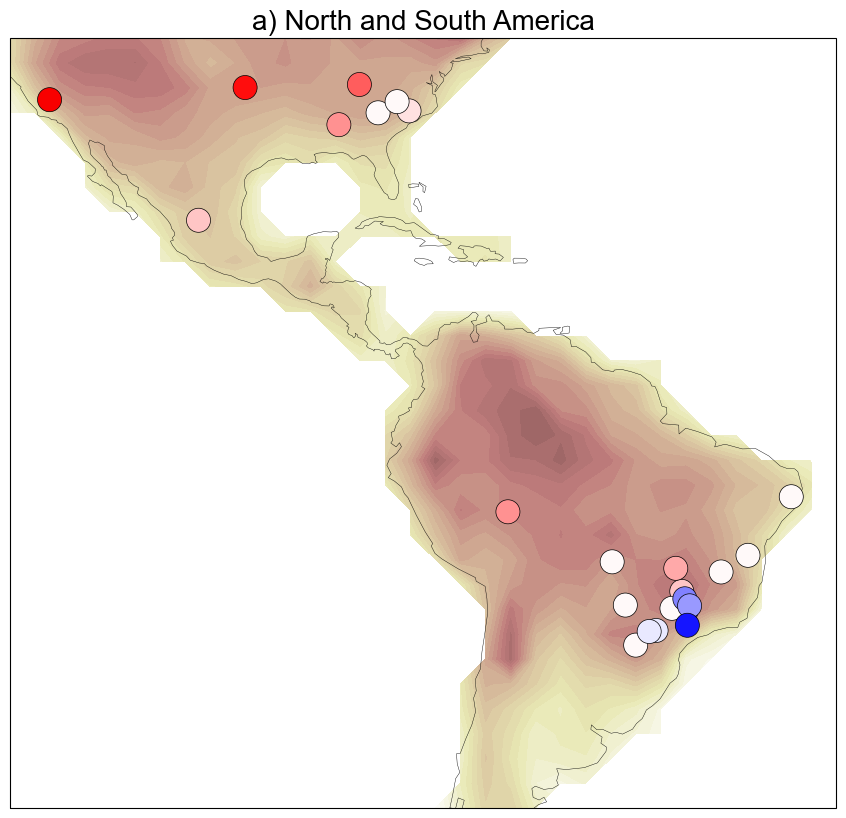

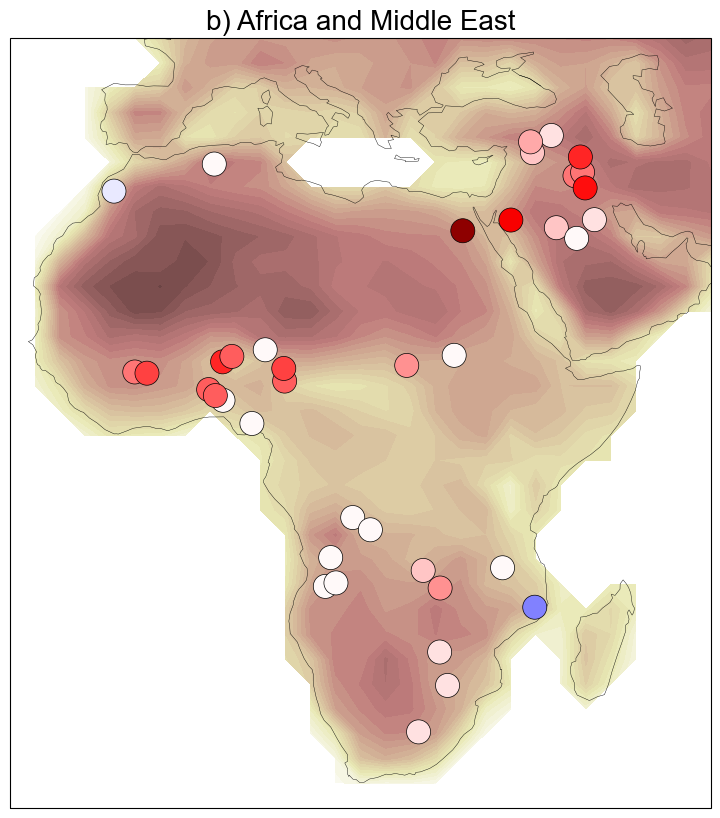

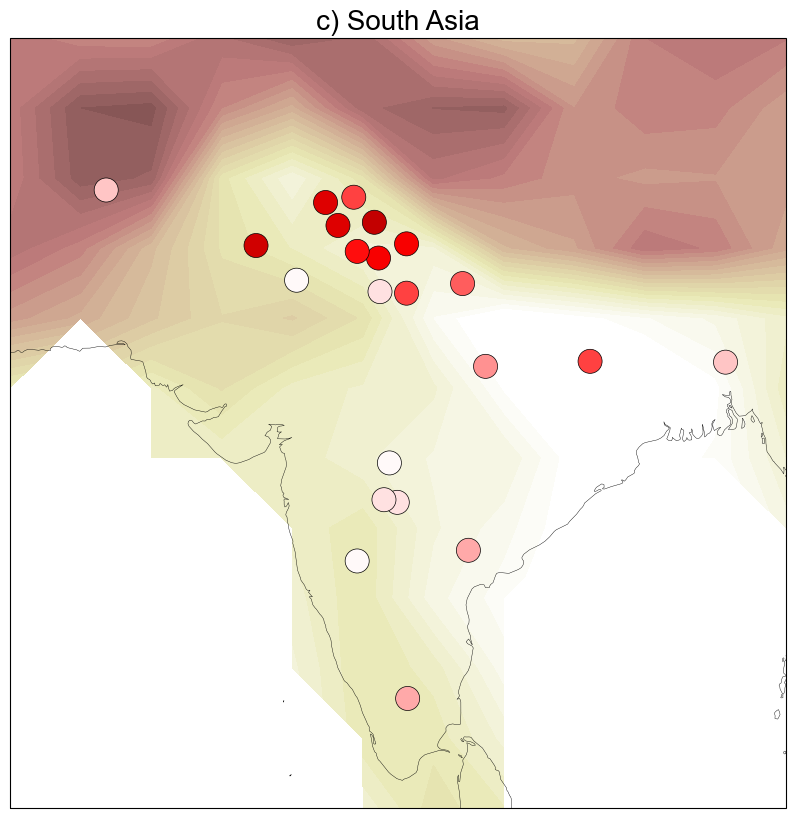

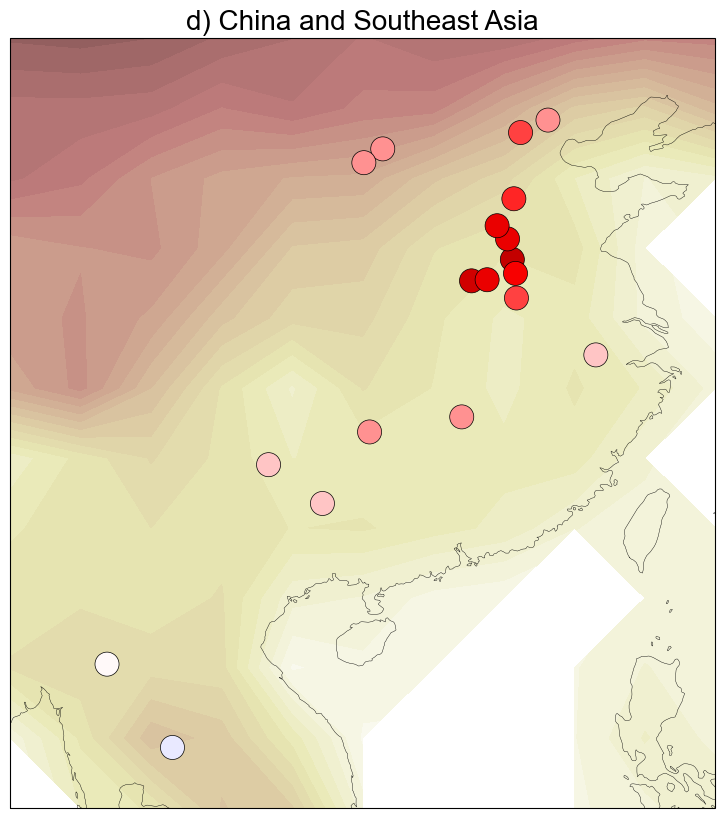

In [136]:
# make sure in right directory to save the files

## magnified plots so more detail can be seen 

os.chdir(os.path.join(et.io.HOME, 'Documents', 'UEA','Urban_Heat', 'PROJECT','Writing_up','Paper',
                    'Key_Figures','Affinity_files'))   

plt.rcParams["font.family"] = "arial"
plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
#plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=7)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
#plt.rc('figure', titlesize=20)  # fontsize of the figure title


#lon_split0 = [230, 330]
#lon_split1a = [340, 360]
#lon_split1b = [0, 60]
#lon_split2 = [60, 130]

#city_lon_split0 = [-120, -30]
#city_lon_split1 = [-20, 60]
#city_lon_split2 = [60, 135]

lon_split0 = [-125, -30]
lon_split1 = [-20, 60]
lon_split2 = [60, 95]
lon_split3 = [95, 125]

titles = ['a) North and South America', 'b) Africa and Middle East', 'c) South Asia', 'd) China and Southeast Asia']

#lon_splits = [lon_split0 ,lon_split1a, lon_split1b ,lon_split2 ]
 ####################################
    
    
for i in range(4):
    if i == 0:
        LST_changes_ds_split = LST_changes_ds.sel( lon= slice(lon_split0[0], lon_split0[1])).sel(
                                lat= slice(-45, 45))
    
        suhi_t2m_clim_proj_df_split =suhi_t2m_clim_proj_df[((suhi_t2m_clim_proj_df.Lon >  lon_split0[0])&(
                                                            suhi_t2m_clim_proj_df.Lon <  lon_split0[1]))]
    
    elif i == 1:
        #LST_changes_ds_split = LST_changes_ds.where(((LST_changes_ds.lon > lon_split1a[0]) & (LST_changes_ds.lon < lon_split1a[1]))
        #             | (LST_changes_ds.lon > lon_split1b[0]) & (LST_changes_ds.lon < lon_split1b[1])
        #                , drop=True).sel( lat= slice(-45, 50))
        #LST_changes_ds_split = LST_changes_ds_split.assign_coords(lon=(((LST_changes_ds_split.lon - 180) % 360) - 180))
        #LST_changes_ds_split = LST_changes_ds_split.sortby(LST_changes_ds_split.lon)

        LST_changes_ds_split = LST_changes_ds.sel( lon= slice(lon_split1[0], lon_split1[1])).sel(
                                lat= slice(-40, 50))
        
        suhi_t2m_clim_proj_df_split =suhi_t2m_clim_proj_df[((suhi_t2m_clim_proj_df.Lon >  lon_split1[0])&(
                                                            suhi_t2m_clim_proj_df.Lon <  lon_split1[1]))]
        
    elif i == 2:
        LST_changes_ds_split = LST_changes_ds.sel( lon= slice(lon_split2[0], lon_split2[1])).sel(
                                lat= slice(5, 40))
        suhi_t2m_clim_proj_df_split =suhi_t2m_clim_proj_df[((suhi_t2m_clim_proj_df.Lon >  lon_split2[0])&(
                                                            suhi_t2m_clim_proj_df.Lon <  lon_split2[1]))]
    elif i == 3:
        LST_changes_ds_split = LST_changes_ds.sel( lon= slice(lon_split3[0], lon_split3[1])).sel(
                                lat= slice(10, 45))
        suhi_t2m_clim_proj_df_split =suhi_t2m_clim_proj_df[((suhi_t2m_clim_proj_df.Lon >  lon_split3[0])&(
                                                            suhi_t2m_clim_proj_df.Lon <  lon_split3[1]))]
        
        
    # for the esm contour
    esm_lats = LST_changes_ds_split.lat
    esm_lons = LST_changes_ds_split.lon
    esm_lst_change = LST_changes_ds_split.Median_LST_change

    # for the city suhi changes
    city_lats = suhi_t2m_clim_proj_df_split.Lat.values
    city_lons = suhi_t2m_clim_proj_df_split.Lon.values
    lst_plus_suhi_change = suhi_t2m_clim_proj_df_split.LST_Change_plus_SUHI_Change.values
    suhi_change = suhi_t2m_clim_proj_df_split.median_var_change.values
    
    
    #if i ==1:
        #esm_lst_change, esm_lons = add_cyclic_point(esm_lst_change, coord=esm_lons)
 
    fig = plt.figure(figsize=(15,10))
    ax = plt.axes(projection=ccrs.PlateCarree(),title=titles[i])
    ax.coastlines(linewidth=0.3)

    # create the colormap for esm lst changes, probs should move this to before loop but takes no time sooo
    scale_min = 1
    scale_max = 4
    cmap = plt.cm.pink_r.copy()
    #cmap = plt.cm.hot_r
#cmap = plt.cm.plasma_r
    #cmap = plt.cm.viridis.copy()
    

    # extract all colors from the .bwr map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    cmap.set_under(cmaplist[0])
    # create the new map
    #cmap = mpl.colors.LinearSegmentedColormap.from_list(
    #    'Custom cmap', cmaplist, cmap.N)
 
    bounds = np.linspace(scale_min, scale_max, 31)
    bounds_for_colorbar = np.linspace(scale_min, scale_max, 4)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

    #coord system to plot on
    coord=ccrs.PlateCarree()
    esm_im = ax.contourf(esm_lons,esm_lats,esm_lst_change,transform=coord, cmap=cmap, norm = norm, levels = bounds,
                         extend = 'min')
    
    #plt.colorbar(esm_im, cax=pos_cax, label = 'ESM $\Delta$LST (\u00b0C)', cmap= cmap, norm = norm
    #        ,spacing='proportional' ,  ticks=bounds_for_colorbar, boundaries=bounds, format='%1i',orientation='horizontal')


    # create a new colormap, as the range is smaller for the suhi change only 
    scale_min = -1
    scale_max = 2
    cmap = cmap_crop

    # extract all colors from the .bwr map
    cmaplist = [cmap_crop(i) for i in range(cmap_crop.N)]

    bounds = np.linspace(scale_min, scale_max, 31)
    bounds_for_colorbar = np.linspace(scale_min, scale_max, 4)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

    im = ax.scatter(city_lons, city_lats, zorder=5, c=suhi_change, linewidths = 0.5, s =300,edgecolor = 'black',
               cmap= cmap, norm=norm)

    
    #save figure as png
    plt.savefig('split_map_rerf_separate_cbar_{}.png'.format(i), bbox_inches = 'tight', dpi = 1200)


In [137]:
#############################################################################
############# Look at the changes in the warmest 3 months ###################
#############################################################################

# first get the median, 10th and 90th percentile changes for each season 
seasons = ['MAM','JJA','SON','DJF']
season_spread_df = pd.DataFrame ()

for i in range(len(CITY_COUNTRY_list)):
    CITY_COUNTRY = CITY_COUNTRY_list[i]
    lat = (model_annual_mean_pred_df[model_annual_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY].Lat.values[0])
    lon = (model_annual_mean_pred_df[model_annual_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY].Lon.values[0])
        
    for season in seasons:
        var_changes = (model_season_mean_pred_df[(model_season_mean_pred_df['CITY_COUNTRY'] == CITY_COUNTRY)&
                                   (model_season_mean_pred_df['Season'] == season)].SUHI_CHANGE)

        if var_changes.size == 0:
            df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon],'Season':[season], 
                  'median_change':[np.nan],
                  'ten_percentile_change':[np.nan],
                  'ninety_percentile_change':[np.nan]}, index = [i])
        else:
            
            df = pd.DataFrame({'CITY_COUNTRY': [CITY_COUNTRY], 'Lat':[lat], 'Lon':[lon],'Season':[season],
                  'median_change':[np.percentile(var_changes, 50)],
                  'ten_percentile_change':[np.percentile(var_changes, 10)],
                  'ninety_percentile_change':[np.percentile(var_changes, 90)]}, index = [i])

        season_spread_df = pd.concat([season_spread_df, df])

In [138]:
all_monthly_data_df2['Season'] = np.nan
for count, month in enumerate(all_monthly_data_df2.month):
    if month in [3,4,5]:
        all_monthly_data_df2.loc[count, 'Season'] = 'MAM'
    elif month in [6,7,8]:
        all_monthly_data_df2.loc[count, 'Season'] = 'JJA'
    elif month in [9,10,11]:
        all_monthly_data_df2.loc[count, 'Season'] = 'SON' 
    elif month in [12,1,2]:
        all_monthly_data_df2.loc[count, 'Season'] = 'DJF'


In [139]:
# get the warmest month for each city
mon_mean_t2m = all_monthly_data_df2.groupby(['CITY_COUNTRY','Season']).mean(numeric_only = True).reset_index(
                )[['CITY_COUNTRY','Season','T2M','SUHI_MEAN','RERF_SUHI_MEAN']]

max_t2m_seasons_df = pd.DataFrame ()
for CITY_COUNTRY in CITY_COUNTRY_lat_lon.CITY_COUNTRY:
    max_t2m = mon_mean_t2m[mon_mean_t2m.CITY_COUNTRY == CITY_COUNTRY].T2M.max()
    max_season = mon_mean_t2m[(mon_mean_t2m.CITY_COUNTRY == CITY_COUNTRY)&(mon_mean_t2m.T2M == max_t2m)].copy()
    max_t2m_seasons_df = pd.concat([max_t2m_seasons_df,max_season])

max_t2m_seasons_df = max_t2m_seasons_df.reset_index(drop = True)

# add in the changes in SUHI_MEAN, by percentile
max_t2m_seasons_df = pd.merge(max_t2m_seasons_df, season_spread_df, on = ['CITY_COUNTRY','Season'],how = 'left')

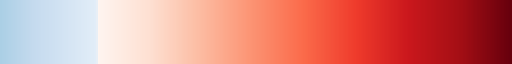

In [142]:
# Custom colormaps for the MEAN_SUHI during warm season, as it goes from -4 to 8 


# creation of custom colormap so the white part is still centered on zero
cmap = plt.cm.Reds # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

cmap_low = plt.cm.Blues_r # define the colormap
# extract all colors from the .bwr map
cmaplist_low = [cmap_low(i) for i in range(cmap_low.N)]

# create the new map
cmap_low = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist_low, cmap_low.N)

length_colormap_low = int((256/0.6)-256)    

cmaplist_low2 = cmaplist_low[length_colormap_low:230]

lengthlow2 = length_colormap_low - (256-230)

# create the new map
#cmap_low2 = mpl.colors.LinearSegmentedColormap.from_list(
#    'Custom cmap', cmaplist_low2, cmap_low2.N)

cmaplist_all = (cmaplist_low2 + cmaplist)

cmap_all = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist_all, (lengthlow2 +cmap.N))

cmap_all

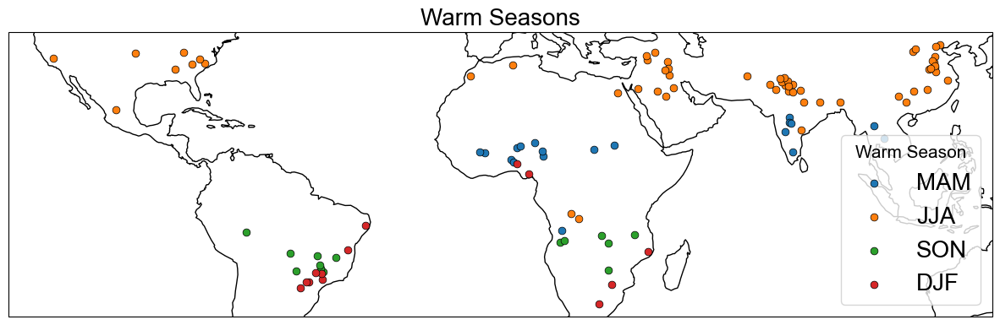

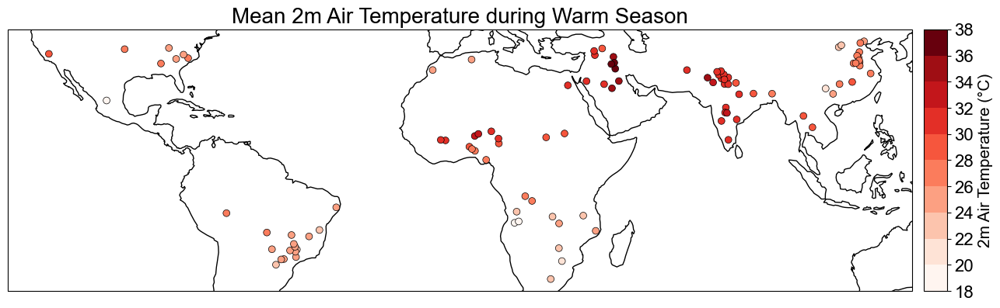

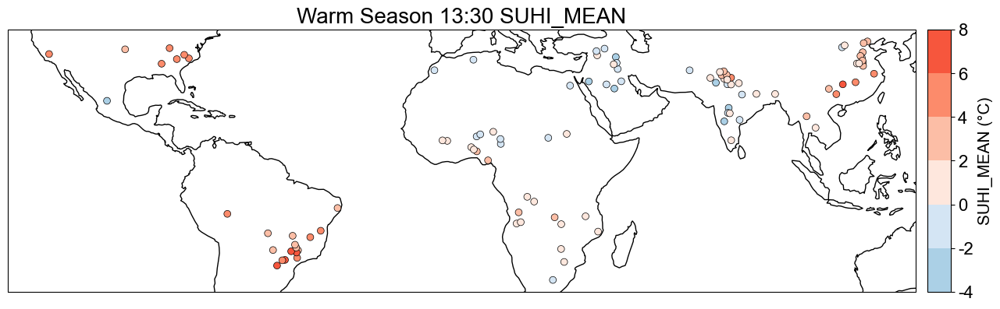

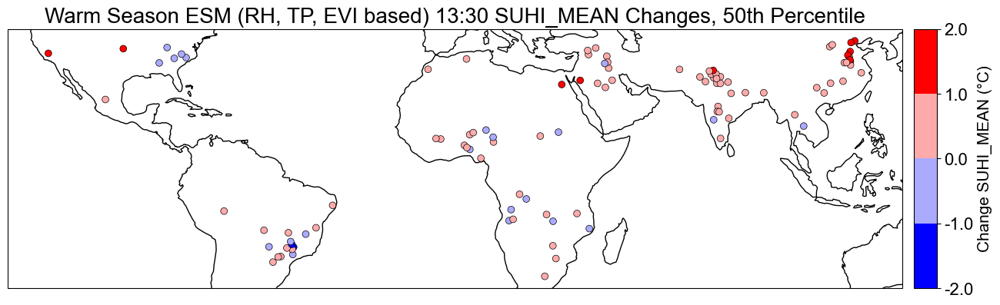

In [144]:
### Plot with the warm season
######################################################
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='Warm Seasons')
ax.coastlines()

for season in seasons:
    df = max_t2m_seasons_df[max_t2m_seasons_df.Season == season]
    city_lons = df.Lon
    city_lats = df.Lat
    ax.scatter(city_lons, city_lats, zorder=5, label = season, linewidths = 0.5, s =40,edgecolor = 'black')
    
ax.legend(title = 'Warm Season', loc = 4)
#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes'))   
plt.savefig('warm_season_month.png'.format(climate_var), bbox_inches = 'tight')
######################################################

## plots with colorscales

city_lats = max_t2m_seasons_df.Lat.values
city_lons = max_t2m_seasons_df.Lon.values
t2m = max_t2m_seasons_df.T2M.values - 273.15
suhi = max_t2m_seasons_df.SUHI_MEAN.values
median_change = max_t2m_seasons_df.median_change.values
ten_percentile_change = max_t2m_seasons_df.ten_percentile_change.values
ninety_percentile_change = max_t2m_seasons_df.ninety_percentile_change.values

### Plot with the air temp during the warm season 
######################################################
# create the colormap
scale_min = 18
scale_max = 38
cmap = plt.cm.Reds # define the colormap
# extract all colors from the map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 11)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='Mean 2m Air Temperature during Warm Season')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=t2m, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = '2m Air Temperature (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes'))   
plt.savefig('warm_season_2m_air_temp.png'.format(climate_var), bbox_inches = 'tight')
######################################################
### Plot of the SUHI_MEAN during the warm season

# create the colormap
scale_min = -4
scale_max = 8
cmap = plt.cm.bwr  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 7)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='Warm Season 13:30 SUHI_MEAN')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=suhi, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap_all, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'SUHI_MEAN (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes'))   
plt.savefig('warm_season_suhi_mean.png'.format(climate_var), bbox_inches = 'tight')
######################################################
### Plot of the median SUHI_MEAN change during the warm season 

# create the colormap
scale_min = -2
scale_max = 2
cmap = plt.cm.bwr  # define the colormap
# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 5)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='Warm Season ESM (RH, TP, EVI based) 13:30 SUHI_MEAN Changes, 50th Percentile')
ax.coastlines()

im = ax.scatter(city_lons, city_lats, zorder=5, c=median_change, linewidths = 0.5, s =40,edgecolor = 'black',
               cmap= cmap, norm=norm)

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.01 #+ 0.25*axpos.width
pos_y = axpos.y0  
cax_width = 0.02
cax_height = axpos.height
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'Change SUHI_MEAN (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds, boundaries=bounds, format='%0.1f')

#save figure as png
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes'))   
plt.savefig('warm_season_suhi_change.png'.format(climate_var), bbox_inches = 'tight')
####################################

In [149]:
# getting the warm season LST change
# first add season into the LST df

LST_Proj_df['Season'] = np.nan
for count, month in enumerate(LST_Proj_df.Month):
    if month in [3,4,5]:
        LST_Proj_df.loc[count, 'Season'] = 'MAM'
    elif month in [6,7,8]:
        LST_Proj_df.loc[count, 'Season'] = 'JJA'
    elif month in [9,10,11]:
        LST_Proj_df.loc[count, 'Season'] = 'SON' 
    elif month in [12,1,2]:
        LST_Proj_df.loc[count, 'Season'] = 'DJF'

        
#calculate the median LST change for each season
model_seasonal_LST_df = LST_Proj_df.groupby(['CITY_COUNTRY','Model','Season']).mean(numeric_only = True).reset_index()
median_seasonal_LST_df = model_seasonal_LST_df.groupby(['CITY_COUNTRY','Season']).median(numeric_only = True).reset_index()


# add in the median change in LST to main ds
max_t2m_seasons_df = pd.merge(max_t2m_seasons_df, median_seasonal_LST_df[['CITY_COUNTRY','Season','LST_Change']], 
                                 on = ['CITY_COUNTRY','Season'], how = 'left')

# add in the change in LST plus SUHI change
max_t2m_seasons_df['LST_Change_plus_SUHI_Change']= (max_t2m_seasons_df['LST_Change']+
                                                       max_t2m_seasons_df['median_change'])

# add in the LST plus SUHI change for the nighttime
#night_max_t2m_seasons_df = pd.merge(night_max_t2m_seasons_df, median_seasonal_LST_df[['CITY_COUNTRY','LST_Change']], 
#                                 on = 'CITY_COUNTRY', how = 'left')

#night_max_t2m_seasons_df['LST_Change_plus_SUHI_Change']= (night_max_t2m_seasons_df['LST_Change']+
#                                                       night_max_t2m_seasons_df['median_change'])

In [150]:
######## WARM SEASON PLOT ##########

# first of all need to a ds for the overall warm season delta LST

# use era5-land 2m air temperature to identify the warm months
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','ERA5','2m_air_temperature'))   
air_temp_ds = xr.load_dataset('2m_air_temp.nc')

# get the ds containing the seasonal median LST changes
#os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Climate_Model_Projections'))   
#season_LST_changes_ds = xr.open_dataset('season_LST_changes_ds.nc')

# warm season df
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','ERA5','2m_air_temperature'))   
warm_season_LST_changes_ds = xr.load_dataset('warm_season_LST_changes_ds.nc')

In [ ]:
##############################################
#### DONT NEED TO RUN THIS AGAIN #############
##############################################

#getting the air temp ds in correct format for easy processing in jasmin
air_temp_ds = air_temp_ds.assign_coords(longitude=(air_temp_ds.longitude % 360))
#reorder to start at lon 0 
air_temp_ds = air_temp_ds.sortby(air_temp_ds.longitude)
season_air_temp_ds = air_temp_ds.groupby('time.season').mean('time')
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','ERA5','2m_air_temperature'))  
season_air_temp_ds.to_netcdf('season_air_temp_ds.nc')

In [151]:
# crop out the upper 40N lat as it is not needed
# change coords to -180 to 180 for easier cropping
warm_season_LST_changes_ds = warm_season_LST_changes_ds.assign_coords(lon=(((warm_season_LST_changes_ds.lon - 180) % 360) 
                                                                           - 180))
warm_season_LST_changes_ds = warm_season_LST_changes_ds.sortby(warm_season_LST_changes_ds.lon) #reorder 

warm_season_LST_changes_ds = warm_season_LST_changes_ds.where(
                                    (warm_season_LST_changes_ds.lat <= 50)&(warm_season_LST_changes_ds.lat >= -45)
                                      &(warm_season_LST_changes_ds.lon <= 132)&(warm_season_LST_changes_ds.lon >= -130),
                                    drop = True)

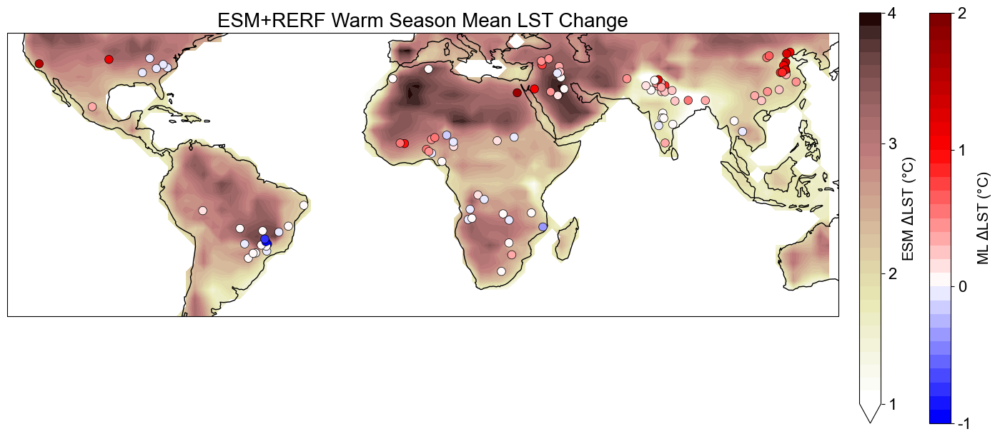

In [153]:
####################################
######## WARM SEASON PLOT ##########
####################################

esm_lats = warm_season_LST_changes_ds.lat
esm_lons = warm_season_LST_changes_ds.lon
esm_lst_change = warm_season_LST_changes_ds.Median_LST_change

esm_lst_change, esm_lons = add_cyclic_point(esm_lst_change, coord=esm_lons)

city_lats = max_t2m_seasons_df.Lat.values
city_lons = max_t2m_seasons_df.Lon.values
suhi_change = max_t2m_seasons_df.median_change.values
lst_plus_suhi_change = max_t2m_seasons_df.LST_Change_plus_SUHI_Change.values

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree(), 
              title='ESM+RERF Warm Season Mean LST Change')
ax.coastlines()

# create the colormap for esm lst changes
scale_min = 1
scale_max = 4
cmap = plt.cm.pink_r.copy()  # define the colormap
#cmap = plt.cm.hot_r
#cmap = plt.cm.plasma_r
#cmap = plt.cm.viridis.copy()

# extract all colors from the .bwr map
cmaplist = [cmap(i) for i in range(cmap.N)]
cmap.set_under(cmaplist[0])
# create the new map
#cmap = mpl.colors.LinearSegmentedColormap.from_list(
#    'Custom cmap', cmaplist, cmap.N)

bounds = np.linspace(scale_min, scale_max, 31) # 40 for continuous cbar, 17 for 1 to 5
bounds_for_colorbar = np.linspace(scale_min, scale_max, 4)#5 for 1 to 5
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

#coord system to plot on
coord=ccrs.PlateCarree()
esm_im = ax.contourf(esm_lons,esm_lats,esm_lst_change,transform=coord, cmap=cmap, levels = bounds, extend = 'min',
                    norm = norm) 

#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.02 #+ 0.25*axpos.width
pos_y = axpos.y0 -0.15
cax_width = 0.02#- 0.3
cax_height = axpos.width -0.2
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(esm_im, cax=pos_cax, label = 'ESM $\Delta$LST (\u00b0C)', cmap= cmap, norm = norm
            ,spacing='proportional' ,  ticks=bounds_for_colorbar, boundaries=bounds, format='%1i',orientation='vertical')


# create a new colormap, as the range is smaller for the suhi change only 
scale_min = -1
scale_max = 2
cmap = cmap_crop

# extract all colors from the .bwr map
cmaplist = [cmap_crop(i) for i in range(cmap_crop.N)]

bounds = np.linspace(scale_min, scale_max, 31)
bounds_for_colorbar = np.linspace(scale_min, scale_max, 4)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

im = ax.scatter(city_lons, city_lats, zorder=5, c=suhi_change, linewidths = 0.5, s =70,edgecolor = 'black',
               cmap= cmap, norm=norm)


#get size and extent of axes:
axpos = ax.get_position()
pos_x = axpos.x0 + axpos.width + 0.085 #+ 0.25*axpos.width
pos_y = axpos.y0 -0.15
cax_width = 0.02
cax_height = axpos.width -0.2
#create new axes where the colorbar should go.
#it should be next to the original axes and have the same height
pos_cax = fig.add_axes([pos_x,pos_y,cax_width,cax_height])

plt.colorbar(im, cax=pos_cax, label = 'ML $\Delta$LST (\u00b0C)', cmap= cmap, norm=norm
            ,spacing='proportional', ticks=bounds_for_colorbar, boundaries=bounds, format='%1i',orientation='vertical')


os.chdir(os.path.join(et.io.HOME, 'Documents', 'UEA','Urban_Heat', 'PROJECT','Writing_up','Paper',
                    'Key_Figures','Affinity_files'))   
plt.savefig('vertical_cbar_warm_season_single_map_esm_rerf_lst_change.png', bbox_inches = 'tight')





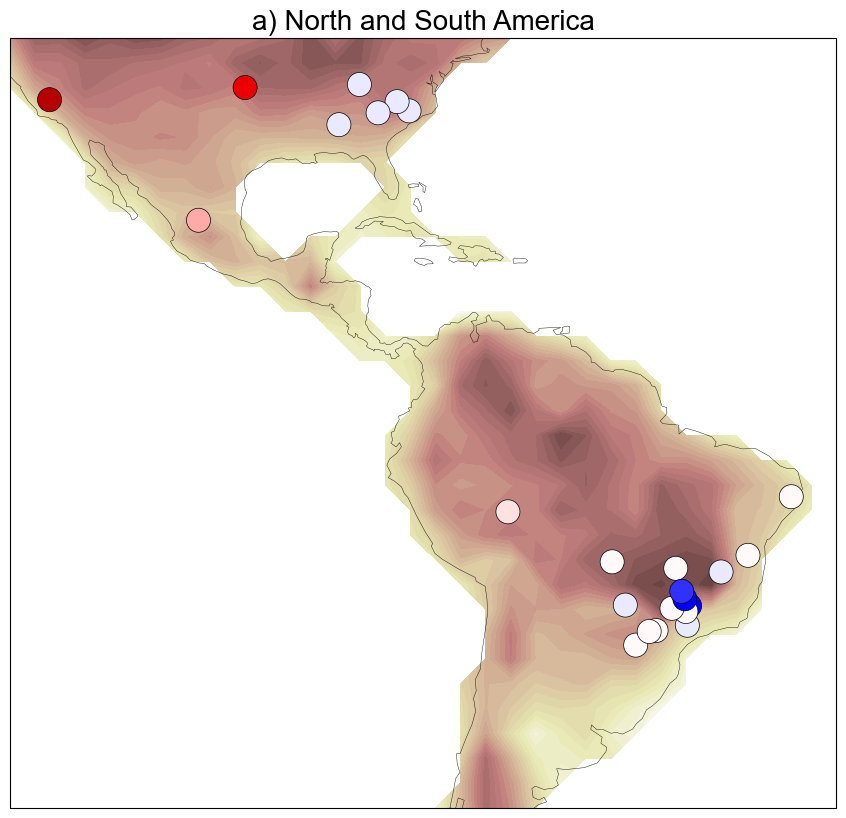

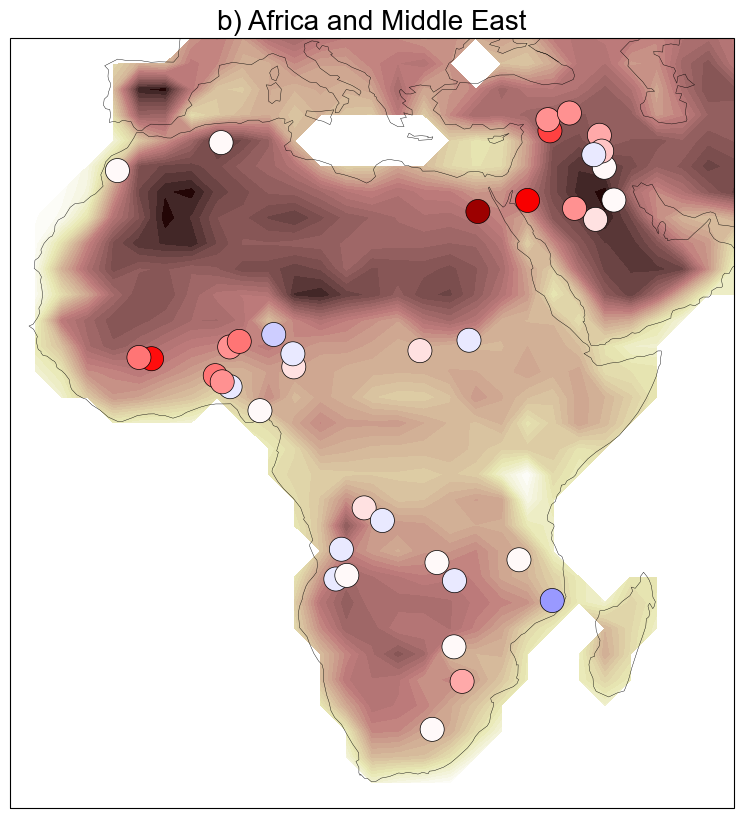

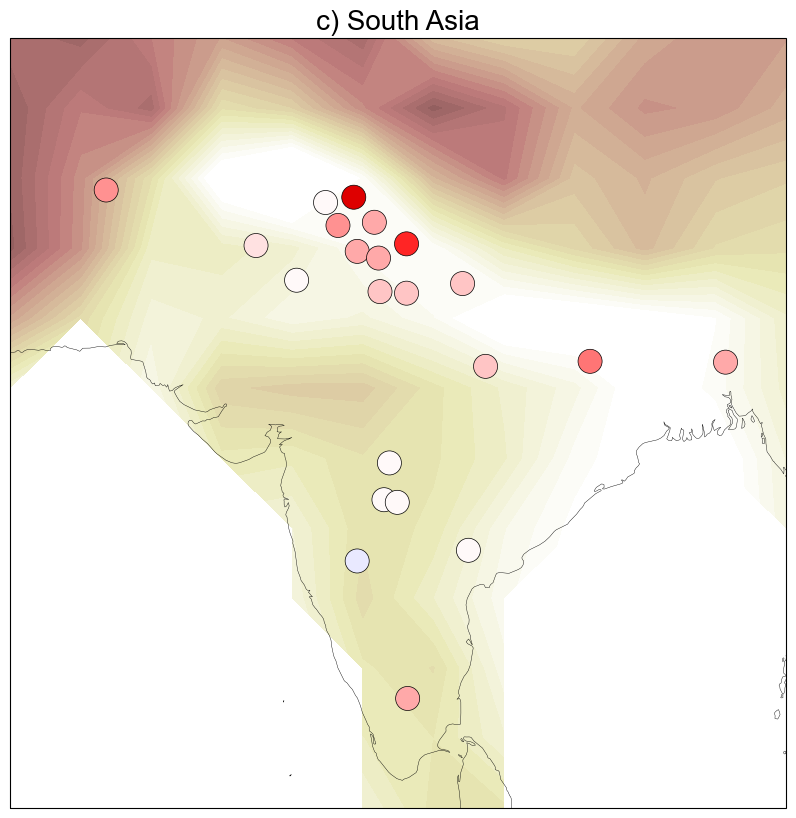

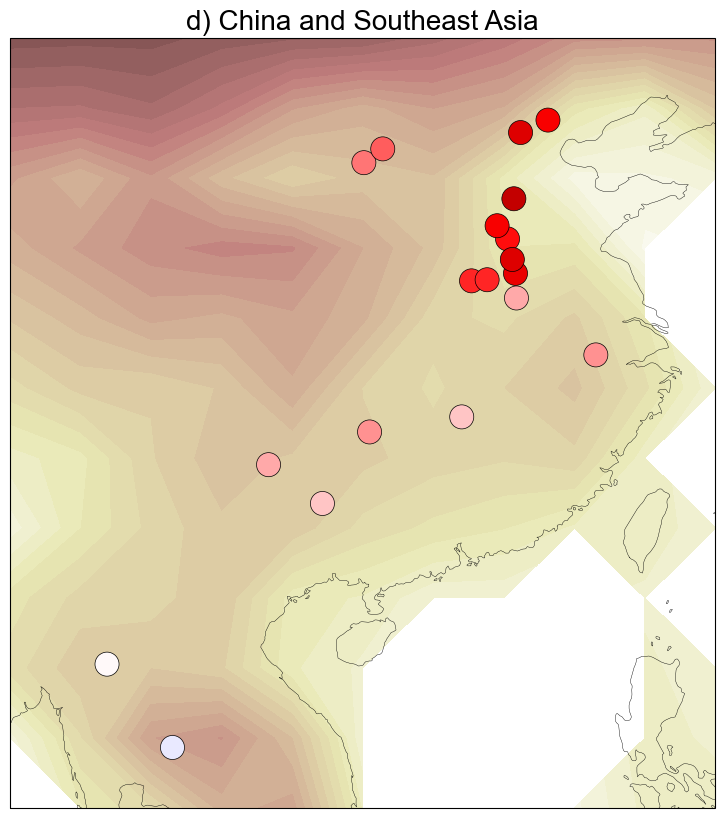

In [157]:
# make sure in right directory to save the files
os.chdir(os.path.join(et.io.HOME, 'Documents', 'UEA','Urban_Heat', 'PROJECT','Writing_up','Paper',
                    'Key_Figures','Affinity_files'))   

plt.rcParams["font.family"] = "arial"
plt.rc('font', size=15)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
#plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
#plt.rc('xtick', labelsize=7)    # fontsize of the tick labels
#plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
#plt.rc('legend', fontsize=20)    # legend fontsize
#plt.rc('figure', titlesize=20)  # fontsize of the figure title


#lon_split0 = [230, 330]
#lon_split1a = [340, 360]
#lon_split1b = [0, 60]
#lon_split2 = [60, 130]

#city_lon_split0 = [-120, -30]
#city_lon_split1 = [-20, 60]
#city_lon_split2 = [60, 135]

lon_split0 = [-125, -30]
lon_split1 = [-20, 60]
lon_split2 = [60, 95]
lon_split3 = [95, 125]

titles = ['a) North and South America', 'b) Africa and Middle East', 'c) South Asia', 'd) China and Southeast Asia']

#lon_splits = [lon_split0 ,lon_split1a, lon_split1b ,lon_split2 ]
 ####################################
    
    
for i in range(4):
    if i == 0:
        LST_changes_ds_split = warm_season_LST_changes_ds.sel( lon= slice(lon_split0[0], lon_split0[1])).sel(
                                lat= slice(-45, 45))
    
        suhi_t2m_clim_proj_df_split =max_t2m_seasons_df[((max_t2m_seasons_df.Lon >  lon_split0[0])&(
                                                            max_t2m_seasons_df.Lon <  lon_split0[1]))]
    
    elif i == 1:
        #LST_changes_ds_split = LST_changes_ds.where(((LST_changes_ds.lon > lon_split1a[0]) & (LST_changes_ds.lon < lon_split1a[1]))
        #             | (LST_changes_ds.lon > lon_split1b[0]) & (LST_changes_ds.lon < lon_split1b[1])
        #                , drop=True).sel( lat= slice(-45, 50))
        #LST_changes_ds_split = LST_changes_ds_split.assign_coords(lon=(((LST_changes_ds_split.lon - 180) % 360) - 180))
        #LST_changes_ds_split = LST_changes_ds_split.sortby(LST_changes_ds_split.lon)

        LST_changes_ds_split = warm_season_LST_changes_ds.sel( lon= slice(lon_split1[0], lon_split1[1])).sel(
                                lat= slice(-40, 50))
        
        suhi_t2m_clim_proj_df_split =max_t2m_seasons_df[((max_t2m_seasons_df.Lon >  lon_split1[0])&(
                                                            max_t2m_seasons_df.Lon <  lon_split1[1]))]
        
    elif i == 2:
        LST_changes_ds_split = warm_season_LST_changes_ds.sel( lon= slice(lon_split2[0], lon_split2[1])).sel(
                                lat= slice(5, 40))
        suhi_t2m_clim_proj_df_split =max_t2m_seasons_df[((max_t2m_seasons_df.Lon >  lon_split2[0])&(
                                                            max_t2m_seasons_df.Lon <  lon_split2[1]))]
    elif i == 3:
        LST_changes_ds_split = warm_season_LST_changes_ds.sel( lon= slice(lon_split3[0], lon_split3[1])).sel(
                                lat= slice(10, 45))
        suhi_t2m_clim_proj_df_split =max_t2m_seasons_df[((max_t2m_seasons_df.Lon >  lon_split3[0])&(
                                                            max_t2m_seasons_df.Lon <  lon_split3[1]))]
        
        
    # for the esm contour
    esm_lats = LST_changes_ds_split.lat
    esm_lons = LST_changes_ds_split.lon
    esm_lst_change = LST_changes_ds_split.Median_LST_change

    # for the city suhi changes
    city_lats = suhi_t2m_clim_proj_df_split.Lat.values
    city_lons = suhi_t2m_clim_proj_df_split.Lon.values
    #lst_plus_suhi_change = suhi_t2m_clim_proj_df_split.LST_Change_plus_SUHI_Change.values
    suhi_change = suhi_t2m_clim_proj_df_split.median_change.values
    
    
    #if i ==1:
        #esm_lst_change, esm_lons = add_cyclic_point(esm_lst_change, coord=esm_lons)
 
    fig = plt.figure(figsize=(15,10))
    ax = plt.axes(projection=ccrs.PlateCarree(),title=titles[i])
    ax.coastlines(linewidth=0.3)

    # create the colormap for esm lst changes, probs should move this to before loop but takes no time sooo
    scale_min = 1
    scale_max = 4
    cmap = plt.cm.pink_r.copy()
    #cmap = plt.cm.hot_r
#cmap = plt.cm.plasma_r
    #cmap = plt.cm.viridis.copy()
    

    # extract all colors from the .bwr map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    cmap.set_under(cmaplist[0])
    # create the new map
    #cmap = mpl.colors.LinearSegmentedColormap.from_list(
    #    'Custom cmap', cmaplist, cmap.N)
 
    bounds = np.linspace(scale_min, scale_max, 31)
    bounds_for_colorbar = np.linspace(scale_min, scale_max, 4)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

    #coord system to plot on
    coord=ccrs.PlateCarree()
    esm_im = ax.contourf(esm_lons,esm_lats,esm_lst_change,transform=coord, cmap=cmap, norm = norm, levels = bounds,
                         extend = 'min')
    
    #plt.colorbar(esm_im, cax=pos_cax, label = 'ESM $\Delta$LST (\u00b0C)', cmap= cmap, norm = norm
    #        ,spacing='proportional' ,  ticks=bounds_for_colorbar, boundaries=bounds, format='%1i',orientation='horizontal')


    # create a new colormap, as the range is smaller for the suhi change only 
    scale_min = -1
    scale_max = 2
    cmap = cmap_crop

    # extract all colors from the .bwr map
    cmaplist = [cmap_crop(i) for i in range(cmap_crop.N)]

    bounds = np.linspace(scale_min, scale_max, 31)
    bounds_for_colorbar = np.linspace(scale_min, scale_max, 4)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

    im = ax.scatter(city_lons, city_lats, zorder=5, c=suhi_change, linewidths = 0.5, s =300,edgecolor = 'black',
               cmap= cmap, norm=norm)
    
    #save figure as png
    plt.savefig('warm_season_split_map_rerf_separate_cbar_{}.png'.format(i), bbox_inches = 'tight', dpi = 1200)


In [167]:
##################################################################################################
######## Creating plot for before after cc individual cities, during the warmest 3 months ########
##################################################################################################

## first get the prediction intervals
#get dataset containing the annual season averages

annual_seasons = all_monthly_data_df2.groupby(['CITY_COUNTRY','year','Season']).mean(numeric_only = True).reset_index(
                )[['CITY_COUNTRY','year','Season','T2M','SUHI_MEAN','RERF_SUHI_MEAN']]

warm_season_annuals = pd.DataFrame()

for i in range(len(max_t2m_seasons_df)):
    CITY_COUNTRY = max_t2m_seasons_df.CITY_COUNTRY.values[i]
    season_max = max_t2m_seasons_df.Season.values[i]

    city_annuals = annual_seasons[(annual_seasons.CITY_COUNTRY == CITY_COUNTRY) & (annual_seasons.Season == season_max
                                                                                  )].copy()
    warm_season_annuals = pd.concat([warm_season_annuals,city_annuals])
    
#reset the index
warm_season_annuals = warm_season_annuals.reset_index(drop = True)

# city specific PIs
city_mean_pi = []
city_pi2 = []
city = []

for CITY_COUNTRY in CITY_COUNTRY_lat_lon.CITY_COUNTRY: 

    pred_intervals = []
    y_obs = warm_season_annuals[warm_season_annuals.CITY_COUNTRY == CITY_COUNTRY].SUHI_MEAN.values
    y_pred_obs = warm_season_annuals[warm_season_annuals.CITY_COUNTRY == CITY_COUNTRY].RERF_SUHI_MEAN.values

    #if there is only 1 observation then the mean == obvs and there will be a divide by zero error
    if len(y_obs) == 1:
        pred_intervals = np.nan
        pred_error1 = np.nan
    else:
        for y0 in warm_season_annuals[warm_season_annuals.CITY_COUNTRY == CITY_COUNTRY].SUHI_MEAN.values:
            pred_err_calc = calc_pred_error_unknown_obvs(y_obs, y_pred_obs, y0)
            pred_intervals.append(pred_err_calc)
        
        pred_error1 = calc_pred_error(y_obs,y_pred_obs)
        
    city_mean_pi.append(np.mean(pred_intervals))
    city_pi2.append(np.mean(pred_error1))
    city.append(CITY_COUNTRY)
    
pi_df = pd.DataFrame({'CITY_COUNTRY':city, 'Mean_PI':city_mean_pi, 'Mean_PI_2':city_pi2})

pi_df = pd.merge(pi_df, CITY_COUNTRY_lat_lon[['CITY_COUNTRY','Lat','Lon']], on = 'CITY_COUNTRY')    

#### Getting the data into the right format for the horizontal bar chart showing before/ after 2 degC warming


#sort by SUHI MEAN
max_t2m_seasons_df = max_t2m_seasons_df.sort_values(by = 'SUHI_MEAN', ascending=False)

#add name for plotting
for i in range(len(CITY_COUNTRY_lat_lon)):
    CITY_COUNTRY = CITY_COUNTRY_lat_lon['CITY_COUNTRY'][i] 
    city_lab = CITY_COUNTRY_lat_lon['City'][i]  + ', ' + CITY_COUNTRY_lat_lon['Country'][i] 
    max_t2m_seasons_df.loc[max_t2m_seasons_df.CITY_COUNTRY == CITY_COUNTRY, 'City, Country']=city_lab


max_t2m_seasons_df['SUHI_MEAN with Climate Change'] = (max_t2m_seasons_df['SUHI_MEAN']+
                                                          max_t2m_seasons_df['median_change'])


max_t2m_seasons_df = pd.merge(max_t2m_seasons_df, pi_df[['CITY_COUNTRY','Mean_PI_2']], on = 'CITY_COUNTRY', 
                                 how = 'left')

max_t2m_seasons_df['low_pi'] = (max_t2m_seasons_df['SUHI_MEAN with Climate Change']-
                                   max_t2m_seasons_df['Mean_PI_2'])
max_t2m_seasons_df['upper_pi'] = (max_t2m_seasons_df['SUHI_MEAN with Climate Change']+
                                    max_t2m_seasons_df['Mean_PI_2'])


north_america = ['GREENVILLE_USA','BIRMINGHAM_USA', 'LEXINGTON_FAYETTE_USA','VISALIA_USA', 'FAYETTEVILLE_USA',
       'WINSTON_SALEM_USA','WICHITA_USA']

south_america = ['MONTES_CLAROS_BRAZIL', 'RIBEIRAO_BRAZIL', 'UBERLANDIA_BRAZIL', 'SAO_JOSE_DO_RIO_PRETO_BRAZIL',
                 'RIO_BRANCO_BRAZIL', 'ANAPOLIS_BRAZIL', 'UBERABA_BRAZIL', 'FRANCA_BRAZIL', 'CUIABA_BRAZIL', 
                 'PIRACICABA_BRAZIL', 'LONDRINA_BRAZIL',  'CASCAVEL_BRAZIL','CARUARU_BRAZIL','MARINGA_BRAZIL', 
                 'VITORIA_DA_CONQUISTA_BRAZIL', 'CAMPO_GRANDE_BRAZIL','ZACATECAS_MEXICO']

subsaharan_africa= ['OGBOMOSHO_NIGERIA', 'UMUAHIA_NIGERIA', 'LIKASI_DMRC','NDOLA_ZAMBIA', 'MALANJE_ANGOLA',
                    'PARAKOU_BENIN','KIKWIT_DMRC', 'SAKI_NIGERIA', 'SIKASSO_MALI', 'BULAWAYO_ZIMBABWE', 
                    'SONGEA_TANZANIA','BOBO_DIOULASSO_BURKINA_FASO',  'TSHIKAPA_DMRC', 'NAMPULA_MOZAMBIQUE',
                    'POLOKWANE_SOUTH_AFRICA', 'HUAMBO_ANGOLA', 'CUITO_ANGOLA', 'GOMBE_NIGERIA',
                   'BIRNIN_KEBBI_NIGERIA','POTISKUM_NIGERIA', 'ZINDER_NIGER', 'SOKOTO_NIGERIA',  
                    'BLOEMFONTEIN_SOUTH_AFRICA']

middle_east = ['FALOOJAH_IRAQ', 'BAAQOOBAH_IRAQ','AL_RAQQA_SYRIA',   'HAFAR_AL_BATIN_SAUDI_ARABIA','HA_IL_SAUDI_ARABIA',
       'BATMAN_TURKEY',  'DIWANIYAH_IRAQ','KIRKUK_IRAQ', 'SANLIURFA_TURKEY', 'KANDAHAR_AFGHANISTAN', 
     'TABUK_SAUDI_ARABIA',   'BURAYDAH_SAUDI_ARABIA']

north_africa = [ 'ASYUT_EGYPT','MARRARECH_MOROCCO',  'EL_DJELFA_ALGERIA' 'AL_OBEID_SUDAN','NYALA_SUDAN']

south_east_asia = ['LAMPANG_THAILAND','NAKHON_RATCHASIMA_THAILAND']
south_asia = [ 'MUZAFFARNAGAR_INDIA', 'PATIALA_INDIA',  'BATHINDA_INDIA', 'JALANDHAR_INDIA', 'KASUR_PAKISTAN', 
              'ROHTAK_INDIA', 'SHAHJAHANPUR_INDIA','MYMENSINGH_BANGLADESH',  'MATHURA_INDIA', 'GAYA_INDIA',
              'ERODE_INDIA', 'HISAR_INDIA', 'BAHAWALPUR_PAKISTAN','NANDED_WAGHALA_INDIA', 'ALWAR_INDIA',
       'KHAMMAM_INDIA', 'SATNA_INDIA','BIKANER_INDIA','PARBHANI_INDIA','BIJAPUR_INDIA', 'AKOLA_INDIA']

east_asia = [ 'HUAIHUA_CHINA','LIUYANG_CHINA', 'HECHI_CHINA','NINGGUO_CHINA','SHANGQIU_CHINA','LUOHE_CHINA',
             'LINQING_CHINA', 'ZHOUKOU_CHINA', 'HEZE_CHINA','FUYANG_CHINA', 'ANSHUN_CHINA', 'PUYANG_CHINA', 
             'ZHUOZHOU_CHINA', 'BOZHOU_CHINA', 'SANHE_CHINA','YULIN_SHAANXI_CHINA', 'SHENMU_CHINA']


for CITY_COUNTRY in max_t2m_seasons_df.CITY_COUNTRY.values:
    if CITY_COUNTRY in north_america:
        city_region = 'North America'
    elif CITY_COUNTRY in south_america:
        city_region = 'South America'
    elif CITY_COUNTRY in subsaharan_africa:
        city_region = 'Subsaharan Africa'
    elif CITY_COUNTRY in north_africa:
        city_region = 'North Africa'
    elif CITY_COUNTRY in middle_east:
        city_region = 'Middle East'
    elif CITY_COUNTRY in south_east_asia:
        city_region = 'South East Asia'
    elif CITY_COUNTRY in south_asia:
        city_region = 'South Asia'
    elif CITY_COUNTRY in east_asia:
        city_region = 'East Asia'
    
    max_t2m_seasons_df.loc[max_t2m_seasons_df.CITY_COUNTRY == CITY_COUNTRY, 'City_Region'] = city_region
    
    
# indicates where the dots showing color coded regions should go    
max_t2m_seasons_df['Region_Position'] = -6 

In [174]:
# remove GOMBE_NIGERIA
max_t2m_seasons_df = max_t2m_seasons_df[max_t2m_seasons_df.CITY_COUNTRY !='GOMBE_NIGERIA'].reset_index(drop = True)

C:\Users\UEA_Laptop\.conda\envs\suhienv_sensitivity\lib\site-packages\seaborn\categorical.py:1680: UserWarning: You passed a edgecolor/edgecolors ([(0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0

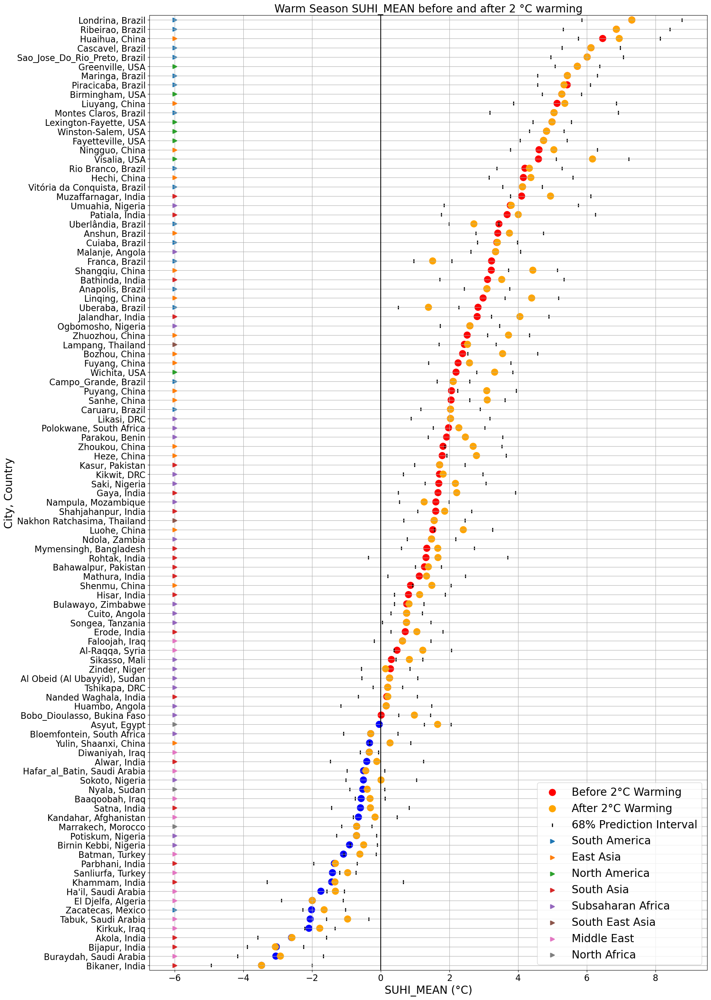

In [175]:
# circle plots

#set the font sizes
plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels
plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title

fig, axes = plt.subplots(1,1, figsize = (20, 30))
fig.tight_layout(pad=15.0)
#fig.suptitle("Peak Magnitude")
#plt.subplots_adjust(top=0.94) # move subplot title position

#import the required package for normalising 
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

clrs = ['blue' if (x < 0) else 'red' for x in max_t2m_seasons_df['SUHI_MEAN'] ]

#clrs2 = ['blue' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

#markers = ["o","s","p","h","D","H" ,"d", "P"],
sns.pointplot(x='SUHI_MEAN', y='City, Country', 
            data=max_t2m_seasons_df,palette = clrs,
            label="Before 2\u00b0C Warming", join = False, scale=1.5)

sns.pointplot(x='SUHI_MEAN with Climate Change', y='City, Country', 
            data=max_t2m_seasons_df,
            label="After 2\u00b0C Warming", color = 'orange', join = False, scale=1.5 )



sns.pointplot(x='low_pi', y='City, Country', 
            data=max_t2m_seasons_df, markers = '|',color = 'k',
            label="68% Prediction Interval", join = False, scale=1)

sns.pointplot(x='upper_pi', y='City, Country', 
            data=max_t2m_seasons_df, markers = '|',color = 'k',
             join = False, scale=1)


sns.pointplot(x='Region_Position', y='City, Country', 
            data=max_t2m_seasons_df,hue = 'City_Region',markers = '>',
            label="City Region", join = False, scale=1)

axes.axvline(0, color = 'k')

axes.set(xlabel = 'SUHI_MEAN (\u00b0C)', title = 'Warm Season SUHI_MEAN before and after 2 \u00b0C warming')
axes.legend(loc = 4)
axes.grid()
#save plot
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes')) 
plt.savefig('warm_season_suhi_w_cc_all_cities.png', bbox_inches = 'tight')

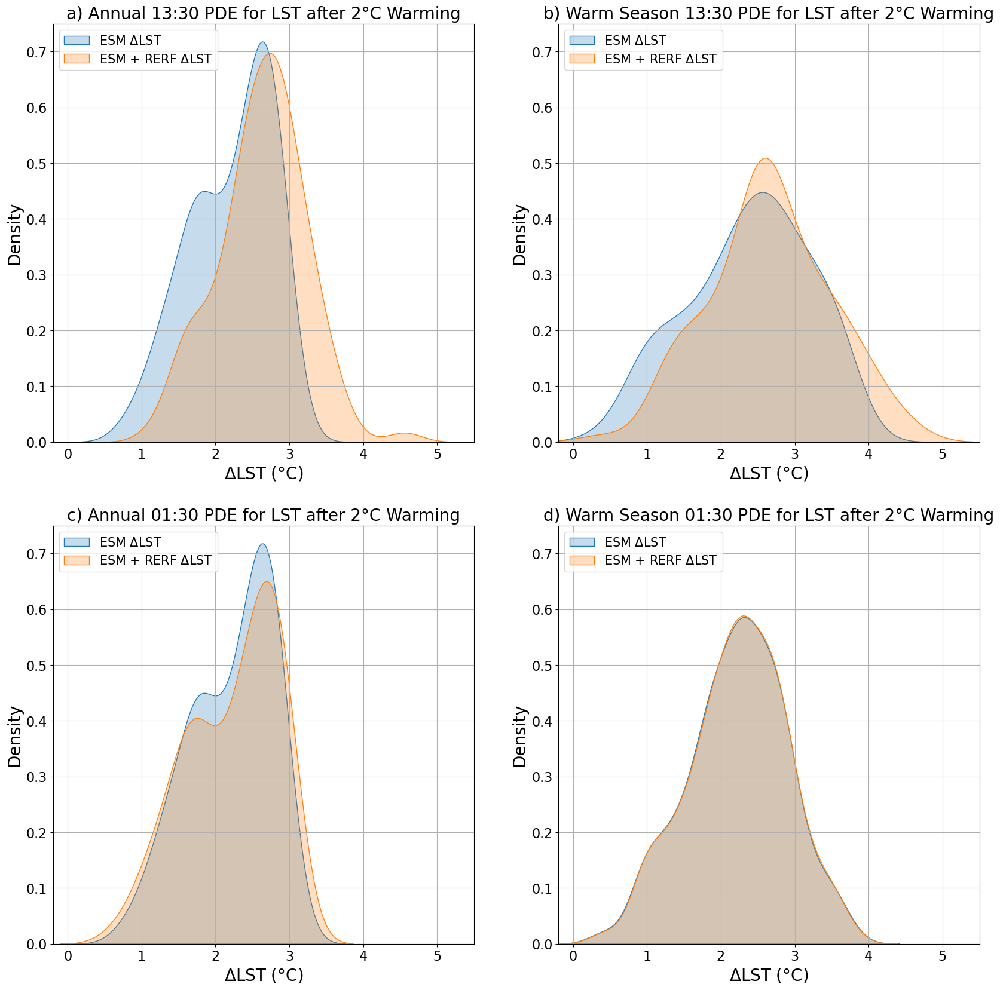

In [185]:
########################################################################
#### PDE of the changes: ESM delta LST, ESM delta LST + delta SUHI #####
########################################################################

#set the font sizes
plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels
plt.rc('legend', fontsize=15)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

fig, axes = plt.subplots(2,2, figsize = (20, 20))
#fig.tight_layout(pad=15.0)

##1330
## ANNUAL ##
sns.kdeplot(data=suhi_t2m_clim_proj_df, x="LST_Change", label="ESM $\Delta$LST", fill = True, ax = axes[0,0])
sns.kdeplot(data=suhi_t2m_clim_proj_df, x="LST_Change_plus_SUHI_Change", label="ESM + RERF $\Delta$LST", 
            fill = True, ax = axes[0,0])
## WARM SEASON ##
sns.kdeplot(data=max_t2m_seasons_df, x="LST_Change", label="ESM $\Delta$LST", fill = True, ax = axes[0,1])
sns.kdeplot(data=max_t2m_seasons_df, x="LST_Change_plus_SUHI_Change", label="ESM + RERF $\Delta$LST", 
            fill = True, ax = axes[0,1])


axes[0,0].set(xlabel = '$\Delta$LST (\u00b0C)', title = "a) Annual 13:30 PDE for LST after 2\u00b0C Warming")
axes[0,0].legend(loc = 2)
axes[0,0].grid()
axes[0,0].set_ylim(0, 0.75)
axes[0,0].set_xlim(-0.2, 5.5)

axes[0,1].set(xlabel = '$\Delta$LST (\u00b0C)', title = "b) Warm Season 13:30 PDE for LST after 2\u00b0C Warming")
axes[0,1].legend(loc = 2)
axes[0,1].grid()
axes[0,1].set_ylim(0, 0.75)
axes[0,1].set_xlim(-0.2, 5.5)

#0130

sns.kdeplot(data=night_suhi_t2m_clim_proj_df, x="LST_Change", label="ESM $\Delta$LST", fill = True, ax = axes[1,0])
sns.kdeplot(data=night_suhi_t2m_clim_proj_df, x="LST_Change_plus_SUHI_Change", label="ESM + RERF $\Delta$LST",  
            fill = True, ax = axes[1,0])
## WARM SEASON ##
sns.kdeplot(data=night_max_t2m_seasons_df, x="LST_Change", label="ESM $\Delta$LST", fill = True, ax = axes[1,1])
sns.kdeplot(data=night_max_t2m_seasons_df, x="LST_Change_plus_SUHI_Change", label="ESM + RERF $\Delta$LST", 
            fill = True, ax = axes[1,1])


axes[1,0].set(xlabel = '$\Delta$LST (\u00b0C)', title = "c) Annual 01:30 PDE for LST after 2\u00b0C Warming")
axes[1,0].legend(loc = 2)
axes[1,0].grid()
axes[1,0].set_ylim(0, 0.75)
axes[1,0].set_xlim(-0.2, 5.5)


axes[1,1].set(xlabel = '$\Delta$LST (\u00b0C)', title = "d) Warm Season 01:30 PDE for LST after 2\u00b0C Warming")
axes[1,1].legend(loc = 2)
axes[1,1].grid()
axes[1,1].set_ylim(0, 0.75)
axes[1,1].set_xlim(-0.2, 5.5)

#save plot
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     )) 
#plt.savefig('LST_CHANGES_PDF_annual_and_warm_seas_means.png', bbox_inches = 'tight')


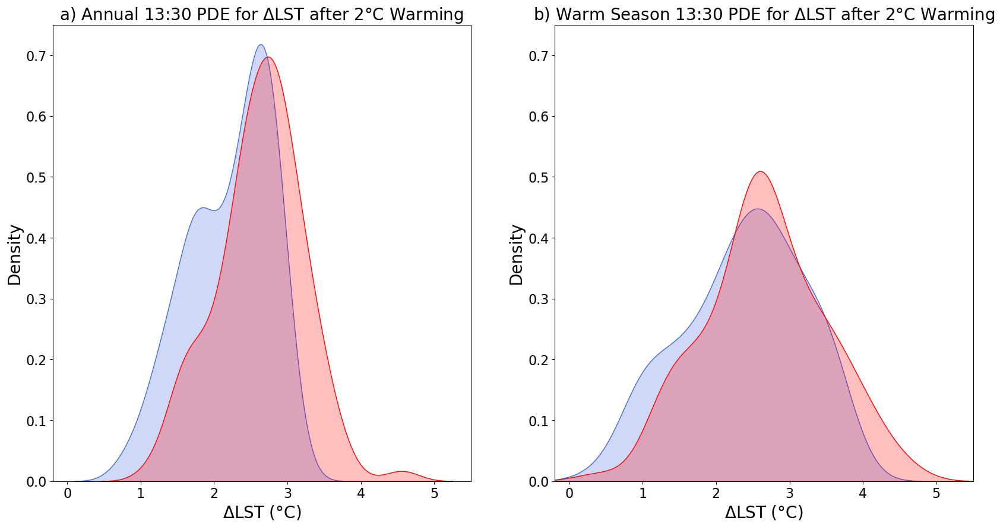

In [190]:
########################################################################
#### PDE of the changes: ESM delta LST, ESM delta LST + delta SUHI #####
########################################################################

#set the font sizes
plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels
plt.rc('legend', fontsize=15)    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title

fig, axes = plt.subplots(1,2, figsize = (20, 10))
#fig.tight_layout(pad=15.0)

##1330
## ANNUAL ##
sns.kdeplot(data=suhi_t2m_clim_proj_df, x="LST_Change", label="ESM Grid $\Delta$LST", fill = True, ax = axes[0], 
            color='royalblue')#'salmon'
sns.kdeplot(data=suhi_t2m_clim_proj_df, x="LST_Change_plus_SUHI_Change", label="City $\Delta$LST", 
            fill = True, ax = axes[0], color = 'red')#'darkred'
## WARM SEASON ##
sns.kdeplot(data=max_t2m_seasons_df, x="LST_Change", label="ESM Grid $\Delta$LST", fill = True, ax = axes[1],
           color='royalblue')
sns.kdeplot(data=max_t2m_seasons_df, x="LST_Change_plus_SUHI_Change", label="City $\Delta$LST", 
            fill = True, ax = axes[1], color = 'red')


axes[0].set(xlabel = '$\Delta$LST (\u00b0C)', title = "a) Annual 13:30 PDE for $\Delta$LST after 2\u00b0C Warming")
#axes[0].legend(loc = 2)
#axes[0].grid()
axes[0].set_ylim(0, 0.75)
axes[0].set_xlim(-0.2, 5.5)

axes[1].set(xlabel = '$\Delta$LST (\u00b0C)', title = "b) Warm Season 13:30 PDE for $\Delta$LST after 2\u00b0C Warming")
#axes[1].legend(loc = 2)
#axes[1].grid()
axes[1].set_ylim(0, 0.75)
axes[1].set_xlim(-0.2, 5.5)

#save plot
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     )) 
plt.savefig('LST_CHANGES_PDF_annual_and_warm_seas_means.png', bbox_inches = 'tight')


In [350]:
#### Adding in region LST changes

model_seasonal_LST_df = LST_Proj_df.groupby(['CITY_COUNTRY','Model','Season']).mean(numeric_only = True).reset_index()
median_season_LST_df = model_seasonal_LST_df.groupby(['CITY_COUNTRY','Season']).median(numeric_only = True).reset_index()

# add in the median change in LST to main ds
max_t2m_seasons_df = pd.merge(max_t2m_seasons_df, median_season_LST_df[['CITY_COUNTRY','Season','LST_Change']], 
                                 on = ['CITY_COUNTRY', 'Season'], how = 'left')

# add in the change in LST plus SUHI change and prediction intervals
max_t2m_seasons_df['LST_Change_plus_SUHI_Change']= (max_t2m_seasons_df['LST_Change']+
                                                       max_t2m_seasons_df['median_change'])

max_t2m_seasons_df['lst_suhi_change_low_pi'] = (max_t2m_seasons_df['LST_Change_plus_SUHI_Change']-
                                   max_t2m_seasons_df['Mean_PI_2'])
max_t2m_seasons_df['lst_suhi_change_upper_pi'] = (max_t2m_seasons_df['LST_Change_plus_SUHI_Change']+
                                    max_t2m_seasons_df['Mean_PI_2'])

# order by LST change, highest to lowest
LST_ordered_max_t2m_seasons_df = max_t2m_seasons_df.copy()
LST_ordered_max_t2m_seasons_df = LST_ordered_max_t2m_seasons_df.sort_values(by = 'LST_Change',ascending=False)

#postition for the region arrows to go
LST_ordered_max_t2m_seasons_df['Region_Position2']=-1

In [351]:
LST_ordered_max_t2m_seasons_df

,CITY_COUNTRY,Season,T2M,SUHI_MEAN,RERF_SUHI_MEAN,Lat,Lon,median_change,ten_percentile_change,ninety_percentile_change,...,upper_pi,City_Region,Region_Position,ANNUAL_MEAN_EVI_R,ANNUAL_MEAN_EVI_U,ANNUAL_MEAN_EVI_D,LST_Change,lst_suhi_change_low_pi,lst_suhi_change_upper_pi,Region_Position2
101,BURAYDAH_SAUDI_ARABIA,JJA,307.807037,-3.055561,-2.078872,26.325990,43.974970,1.328273e-01,0.041857,0.946012,...,-1.677073,Middle East,-6,0.092513,0.092112,-0.000401,3.816574,2.703741,5.195062,-1
81,HAFAR_AL_BATIN_SAUDI_ARABIA,JJA,308.615173,-0.501657,-0.910567,28.425078,45.968830,6.542649e-02,-0.004454,0.070747,...,0.107698,Middle East,-6,0.082177,0.068799,-0.013378,3.752955,3.274453,4.362310,-1
95,EL_DJELFA_ALGERIA,JJA,299.066254,-1.994728,-1.245687,34.672790,3.263000,2.907544e-08,-0.216602,0.336376,...,-1.098810,Middle East,-6,0.141418,0.108670,-0.032748,3.623820,2.727901,4.519739,-1
94,HA_IL_SAUDI_ARABIA,JJA,304.991730,-1.742161,-1.761638,27.521880,41.690730,4.215067e-01,-0.014930,0.627318,...,-1.068353,Middle East,-6,0.061913,0.058077,-0.003836,3.600769,3.769974,4.274577,-1
67,FALOOJAH_IRAQ,JJA,309.400146,0.633605,0.257386,33.355810,43.786120,-1.882252e-07,-0.113951,0.183821,...,1.458967,Middle East,-6,0.136573,0.080502,-0.056072,3.598129,2.772767,4.423491,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,MYMENSINGH_BANGLADESH,JJA,300.958374,1.341518,2.156530,24.750000,90.400000,3.191164e-01,-0.109594,1.165178,...,2.723412,South Asia,-6,0.303215,0.225437,-0.077778,0.961858,0.218197,2.343752,-1
85,SATNA_INDIA,JJA,303.945740,-0.590893,0.019185,24.583330,80.833330,2.900055e-01,0.031729,0.519741,...,0.828643,South Asia,-6,0.240470,0.192245,-0.048224,0.852844,0.013319,2.272380,-1
19,MUZAFFARNAGAR_INDIA,JJA,303.319092,4.102354,3.511865,29.466670,77.683330,8.419960e-01,0.074401,1.685100,...,6.118233,South Asia,-6,0.330150,0.229109,-0.101041,0.844899,0.513012,2.860779,-1
51,GAYA_INDIA,JJA,302.356110,1.667791,1.168428,24.783330,85.000000,5.450598e-01,-0.084266,0.902287,...,3.920766,South Asia,-6,0.260509,0.191561,-0.068948,0.837082,-0.325774,3.090057,-1


C:\Users\UEA_Laptop\.conda\envs\suhienv_sensitivity\lib\site-packages\seaborn\categorical.py:1680: UserWarning: You passed a edgecolor/edgecolors ([(0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0.0, 0.0, 0.0), (0

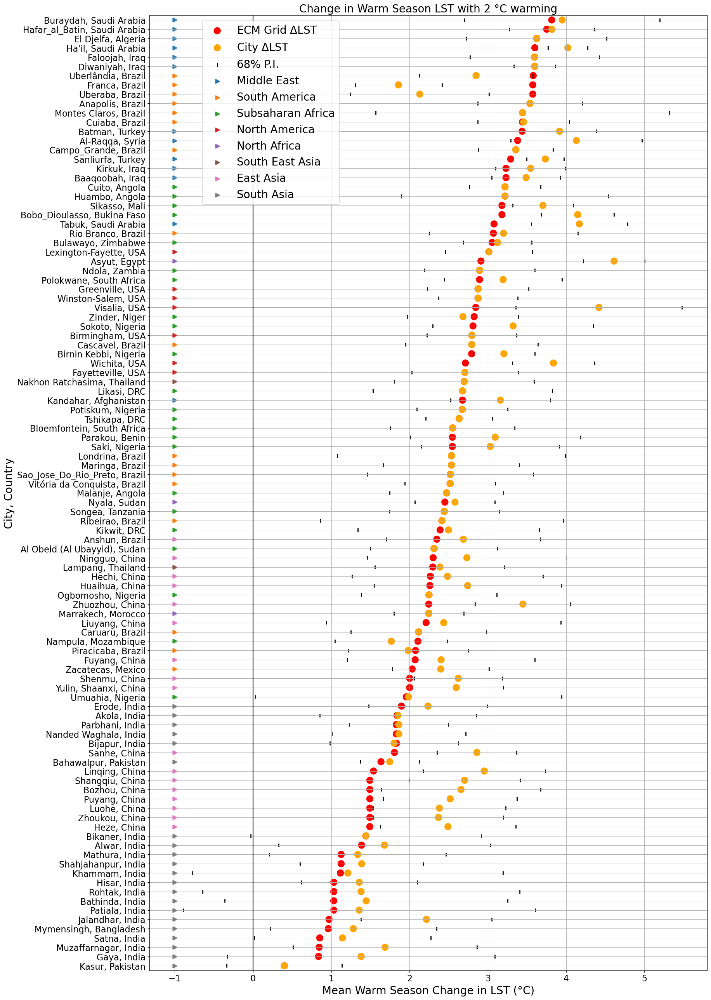

In [352]:
# circle plots

#set the font sizes
plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=16)    # fontsize of the tick labels
plt.rc('ytick', labelsize=16)    # fontsize of the tick labels
plt.rc('legend', fontsize=20)    # legend fontsize
plt.rc('figure', titlesize=30)  # fontsize of the figure title

fig, axes = plt.subplots(1,1, figsize = (20, 30))
fig.tight_layout(pad=15.0)
#fig.suptitle("Peak Magnitude")
#plt.subplots_adjust(top=0.94) # move subplot title position

#import the required package for normalising 
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

#clrs = ['blue' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

#clrs2 = ['blue' if (x < 0) else 'red' for x in suhi_t2m_clim_proj_df['SUHI_MEAN'] ]

#markers = ["o","s","p","h","D","H" ,"d", "P"],
sns.pointplot(x='LST_Change', y='City, Country', 
            data=LST_ordered_max_t2m_seasons_df,color = 'red',
            label= r'ECM Grid $\Delta$LST', join = False, scale=1.5)

sns.pointplot(x='LST_Change_plus_SUHI_Change', y='City, Country', 
            data=LST_ordered_max_t2m_seasons_df,
            label="City $\Delta$LST", color = 'orange', join = False, scale=1.5 )


sns.pointplot(x='lst_suhi_change_low_pi', y='City, Country', 
            data=LST_ordered_max_t2m_seasons_df, markers = '|',color = 'k',
            label="68% P.I.", join = False, scale=1)

sns.pointplot(x='lst_suhi_change_upper_pi', y='City, Country', 
            data=LST_ordered_max_t2m_seasons_df, markers = '|',color = 'k',
             join = False, scale=1)


sns.pointplot(x='Region_Position2', y='City, Country', 
            data=LST_ordered_max_t2m_seasons_df,hue = 'City_Region',markers = '>',
            label="City Region", join = False, scale=1)

axes.axvline(0, color = 'k')

axes.set(xlabel = 'Mean Warm Season Change in LST (\u00b0C)', title = 'Change in Warm Season LST with 2 \u00b0C warming')
axes.legend(loc = 1,bbox_to_anchor=(0.35,1))
axes.grid()
#save plot
os.chdir(os.path.join(et.io.HOME, 'Documents', 'Python_Scripts', 'PROJECT','Chapter_6','climate_projection_plots',
                     'SUHI_MEAN_changes')) 
plt.savefig('warm_season_lst_plus_suhi_w_cc_all_cities.png', bbox_inches = 'tight')

In [353]:
print('percentage >3 deg LST change', 100*len(LST_ordered_max_t2m_seasons_df[LST_ordered_max_t2m_seasons_df.LST_Change >3]
                                             )/104)

print('percentage >3 deg LST change+SUHI', 100*len(LST_ordered_max_t2m_seasons_df[LST_ordered_max_t2m_seasons_df.LST_Change_plus_SUHI_Change >3]
                                             )/104)

print('num cities >3 deg LST change', len(LST_ordered_max_t2m_seasons_df[LST_ordered_max_t2m_seasons_df.LST_Change >3]))
                                             

print('num cities >3 deg LST change+SUHI', len(LST_ordered_max_t2m_seasons_df[LST_ordered_max_t2m_seasons_df.LST_Change_plus_SUHI_Change>3]))

print('num cities >2 deg LST change', len(LST_ordered_max_t2m_seasons_df[LST_ordered_max_t2m_seasons_df.LST_Change >2]))
                                             

print('num cities >2 deg LST change+SUHI', len(LST_ordered_max_t2m_seasons_df[LST_ordered_max_t2m_seasons_df.LST_Change_plus_SUHI_Change>2]))

print('mean region LST change', LST_ordered_max_t2m_seasons_df.LST_Change.mean())
print('mean region LST+SUHI change', LST_ordered_max_t2m_seasons_df.LST_Change_plus_SUHI_Change.mean())

percentage >3 deg LST change 25.0
percentage >3 deg LST change+SUHI 31.73076923076923
num cities >3 deg LST change 26
num cities >3 deg LST change+SUHI 33
num cities >2 deg LST change 73
num cities >2 deg LST change+SUHI 80
mean region LST change 2.384371
mean region LST+SUHI change 2.657603615667736
